In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as spsig
import pycaret.classification as pyclf

import data_postprocessing as dpp

In [3]:
eegData = dpp.eegData(path='Nates')
# can try removing more or fewer channels in code to see what happens with spectrogram noise and ML performance
eegData.load_clean_all_data()

In [74]:
# for interactive plots that pop open in new window
# %matplotlib

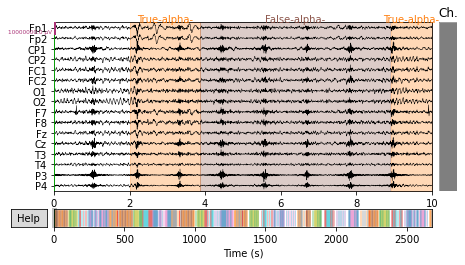

In [4]:
_ = eegData.data.plot(scalings=5)

# Plot the first section of SSVEP signals

In [45]:
# True is 10Hz and False is 15Hz
(eegData.SSVEP_epochs.events[:, -1] == 2)[:10]

array([ True, False, False,  True,  True, False,  True, False, False,
        True])

In [46]:
first_ssvep_data = eegData.data.copy()
first_ssvep_data.crop(99, 166)

<Raw | BCIproject_trial-N-1.2-22-2021_raw.fif.gz, 16 x 67001 (67.0 s), ~8.2 MB, data loaded>

In [47]:
O1_data = first_ssvep_data.pick_channels(['O1']).copy()

In [48]:
o1_data = O1_data.get_data()[0]

In [49]:
fs, ts, spec = spsig.spectrogram(o1_data, fs=1000, nperseg=2000, noverlap=1000)

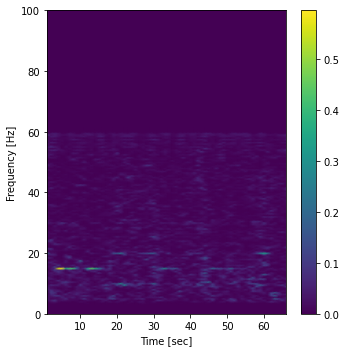

In [50]:
f = plt.figure(figsize=(5, 5))
plt.pcolormesh(ts, fs, spec, shading='gouraud', vmax=None)
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.ylim([0, 100])
plt.colorbar()
plt.tight_layout()

In [12]:
eegData.create_alpha_spectrograms()

False Alpha : 0


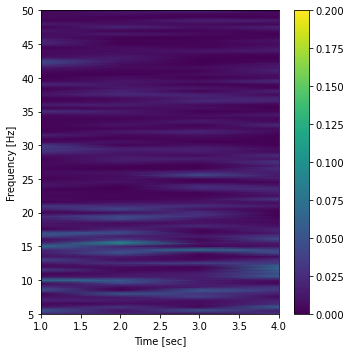

False Alpha : 1


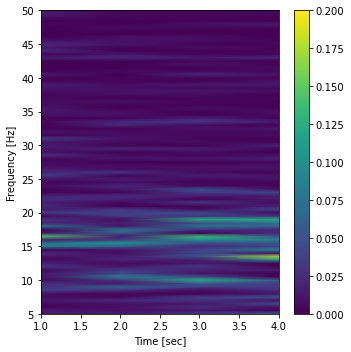

False Alpha : 2


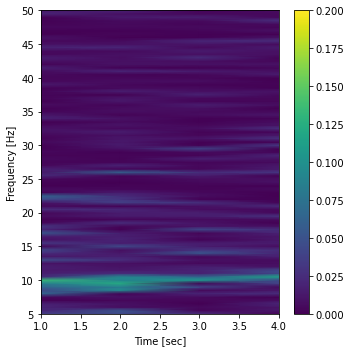

False Alpha : 3


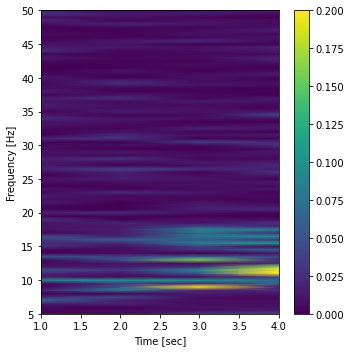

False Alpha : 4


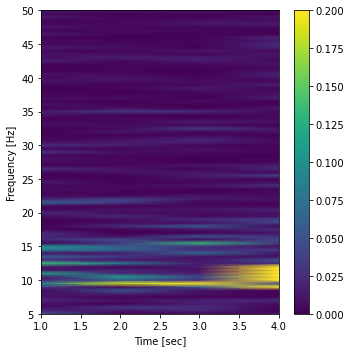

False Alpha : 5


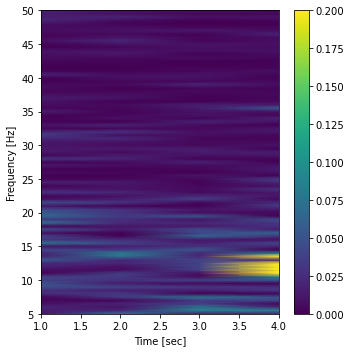

False Alpha : 6


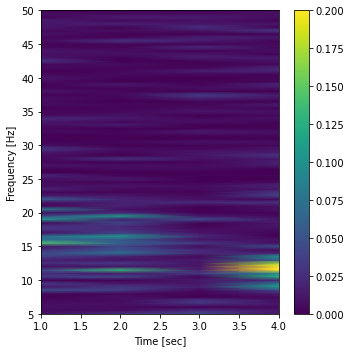

False Alpha : 7


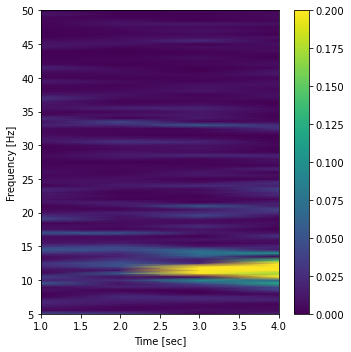

False Alpha : 8


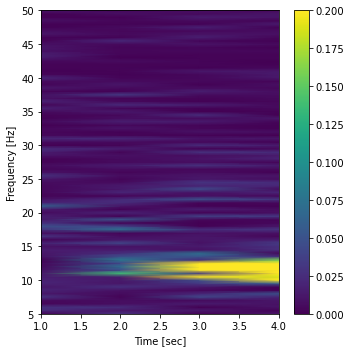

False Alpha : 9


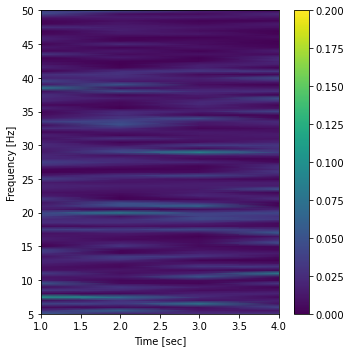

False Alpha : 10


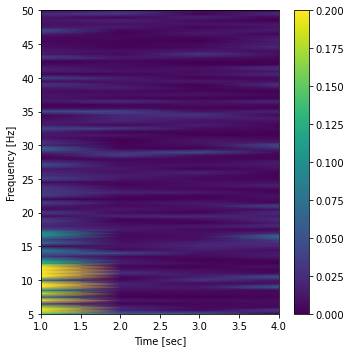

False Alpha : 11


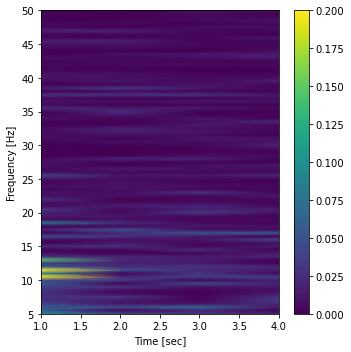

False Alpha : 12


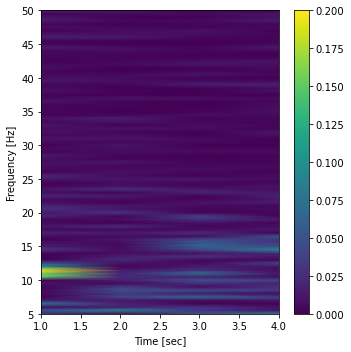

False Alpha : 13


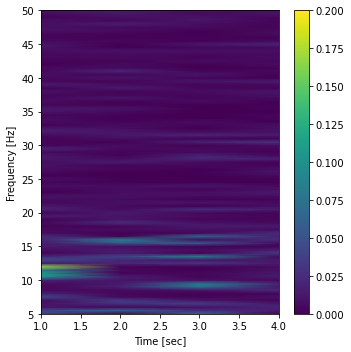

False Alpha : 14


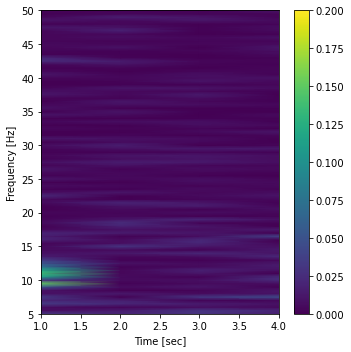

False Alpha : 15


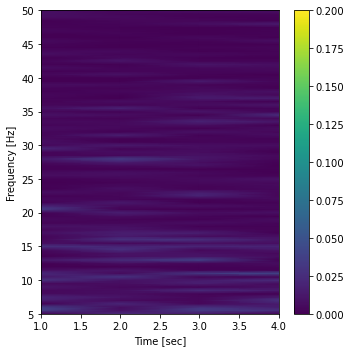

False Alpha : 16


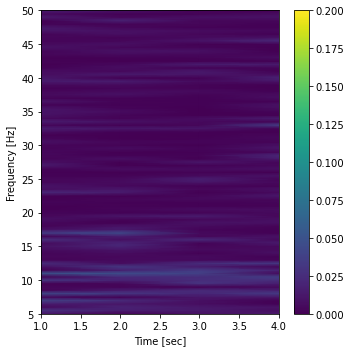

False Alpha : 17


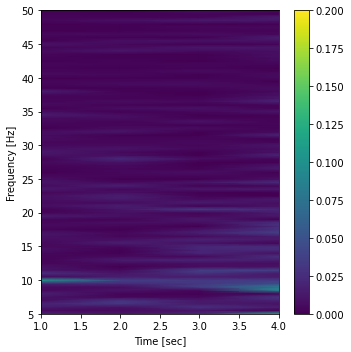

False Alpha : 18


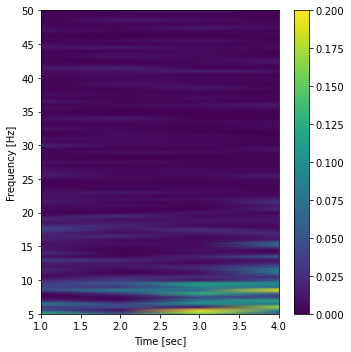

False Alpha : 19


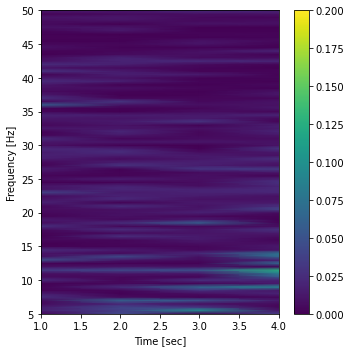

False Alpha : 20


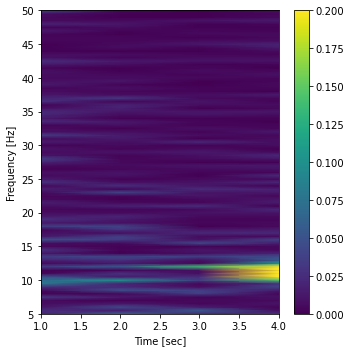

False Alpha : 21


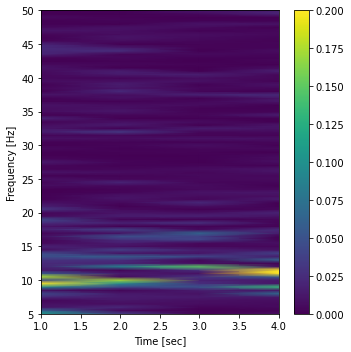

False Alpha : 22


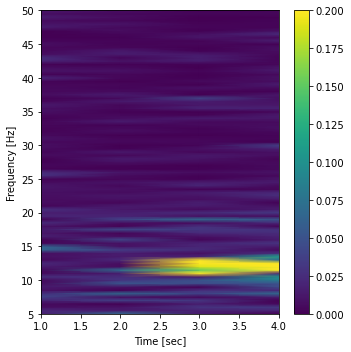

False Alpha : 23


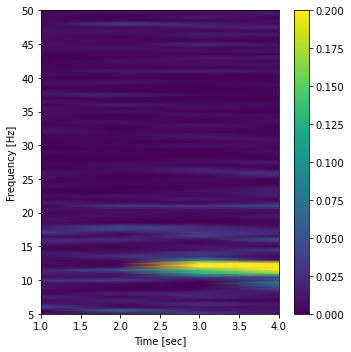

False Alpha : 24


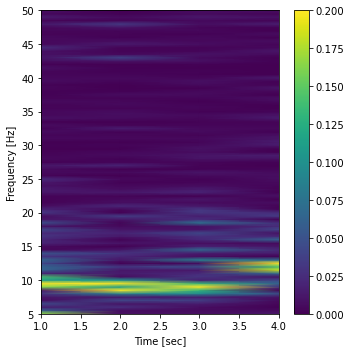

False Alpha : 25


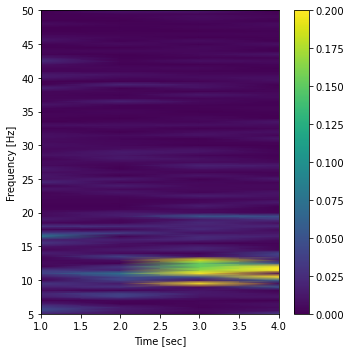

False Alpha : 26


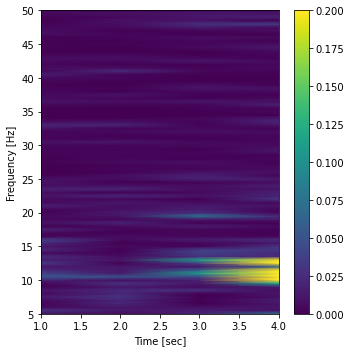

False Alpha : 27


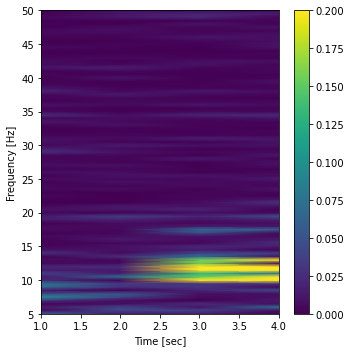

False Alpha : 28


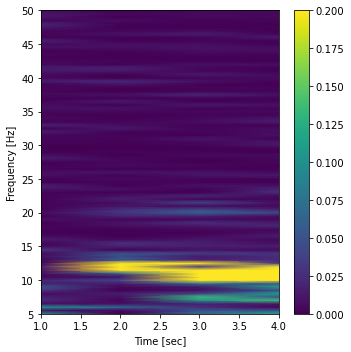

False Alpha : 29


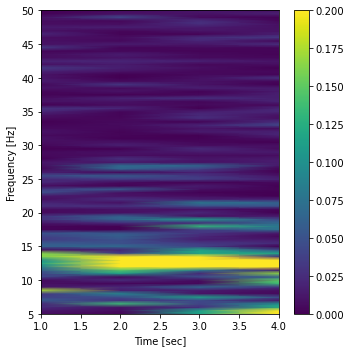

False Alpha : 30


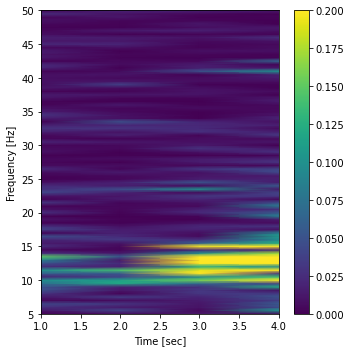

False Alpha : 31


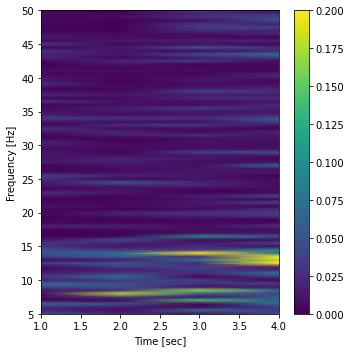

False Alpha : 32


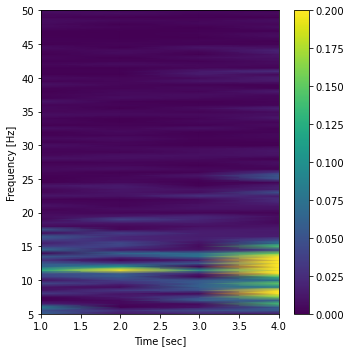

False Alpha : 33


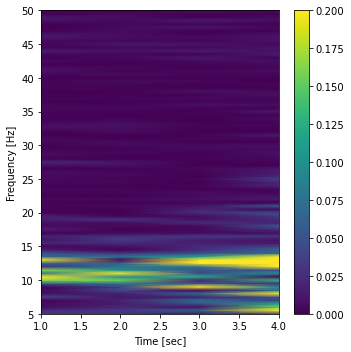

False Alpha : 34


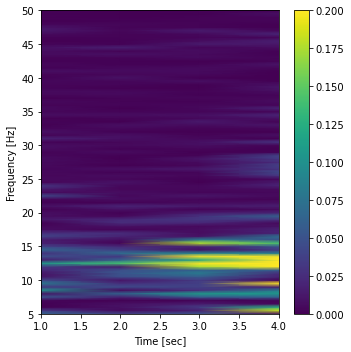

False Alpha : 35


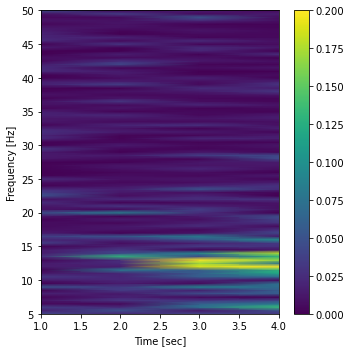

False Alpha : 36


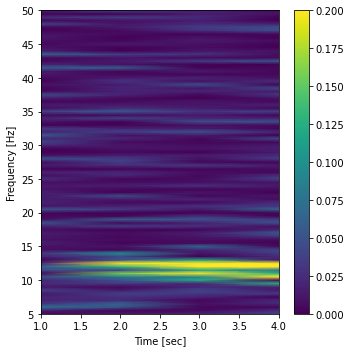

False Alpha : 37


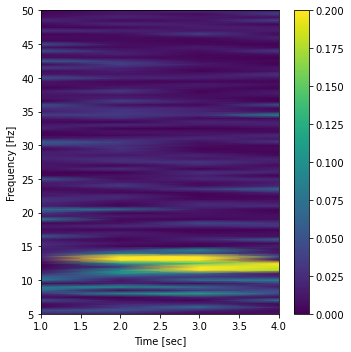

False Alpha : 38


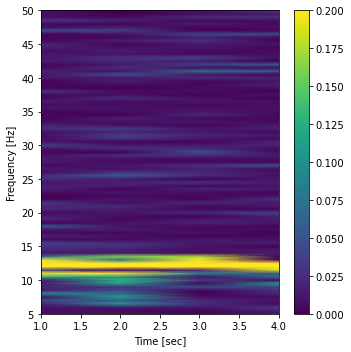

False Alpha : 39


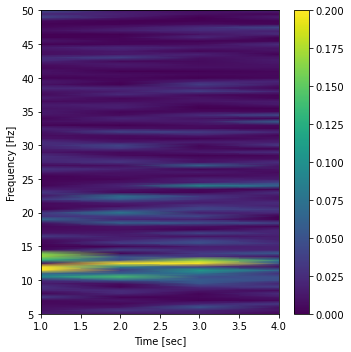

False Alpha : 40


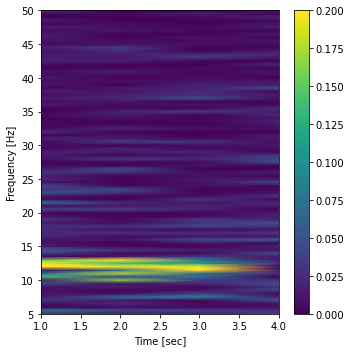

True Alpha : 0


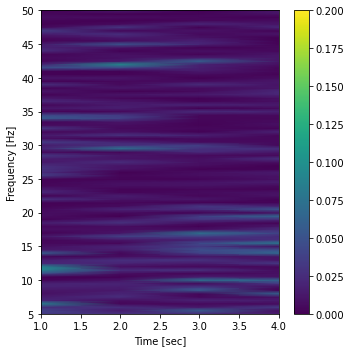

True Alpha : 1


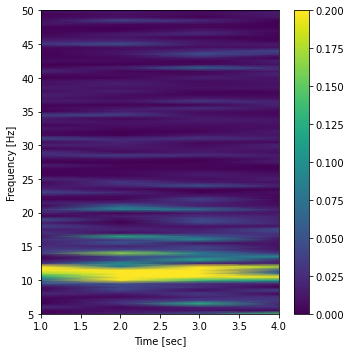

True Alpha : 2


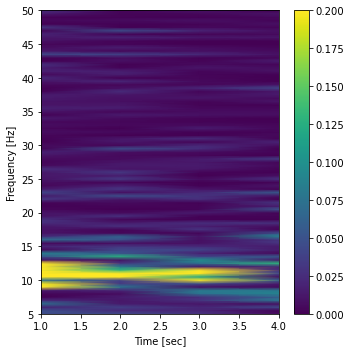

True Alpha : 3


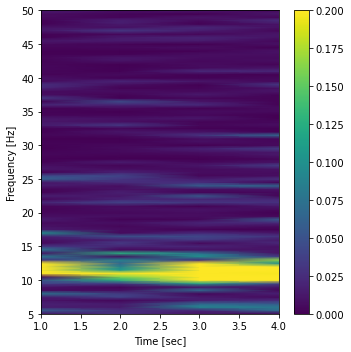

True Alpha : 4


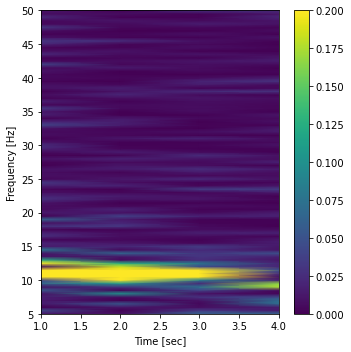

True Alpha : 5


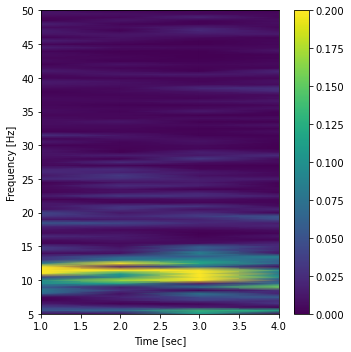

True Alpha : 6


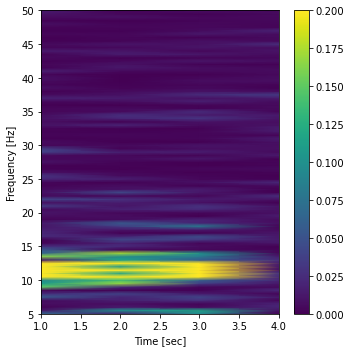

True Alpha : 7


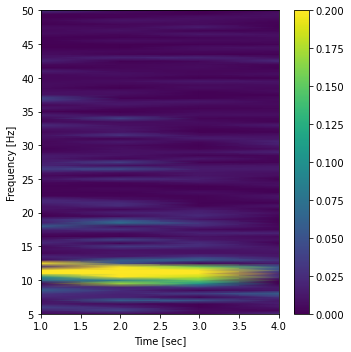

True Alpha : 8


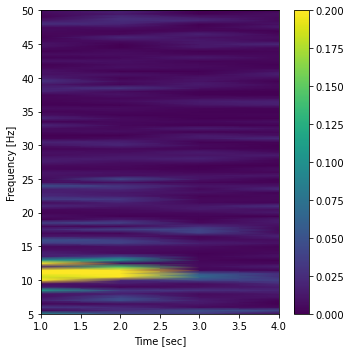

True Alpha : 9


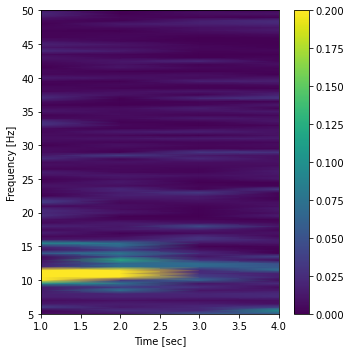

True Alpha : 10


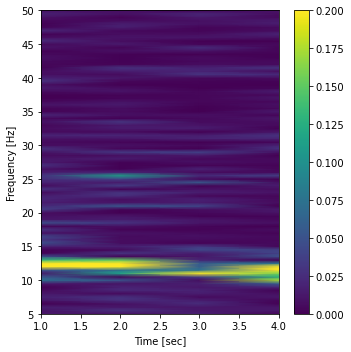

True Alpha : 11


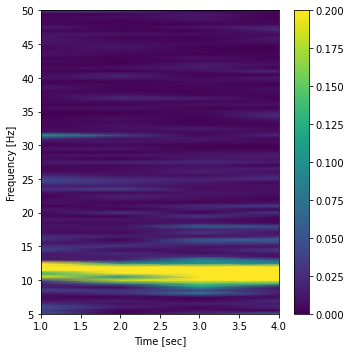

True Alpha : 12


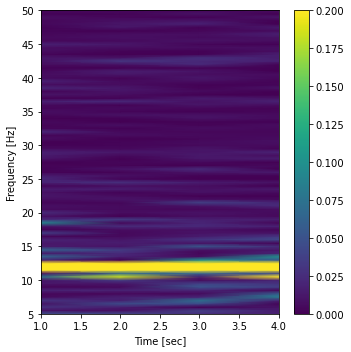

True Alpha : 13


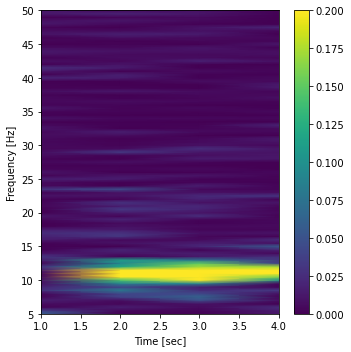

True Alpha : 14


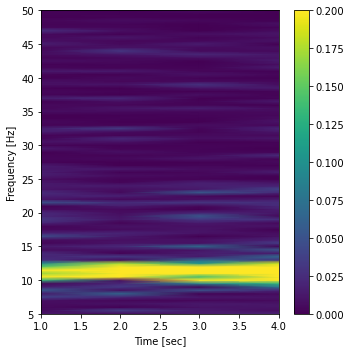

True Alpha : 15


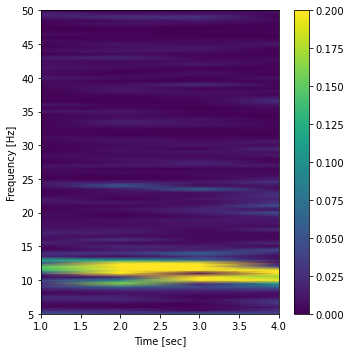

True Alpha : 16


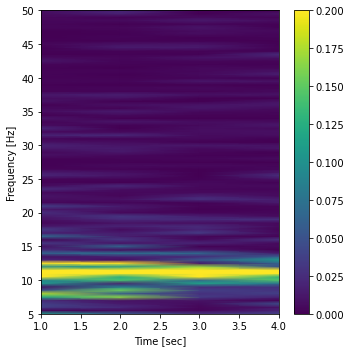

True Alpha : 17


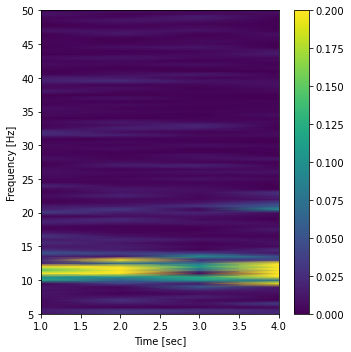

True Alpha : 18


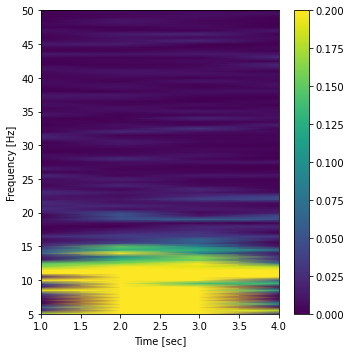

True Alpha : 19


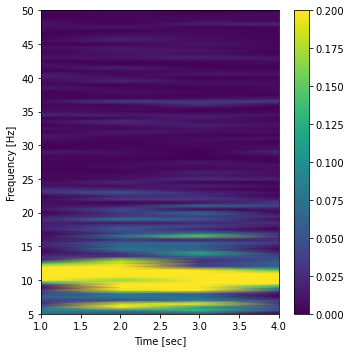

True Alpha : 20


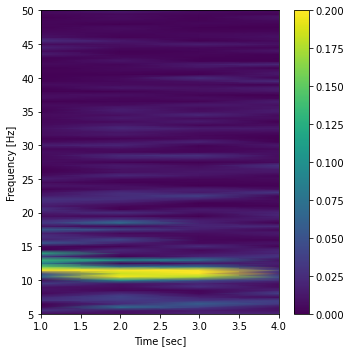

True Alpha : 21


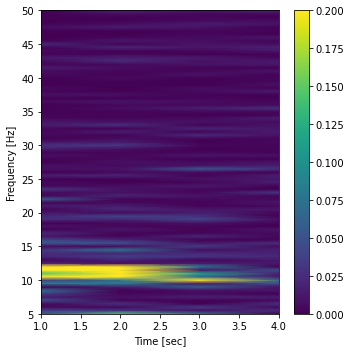

True Alpha : 22


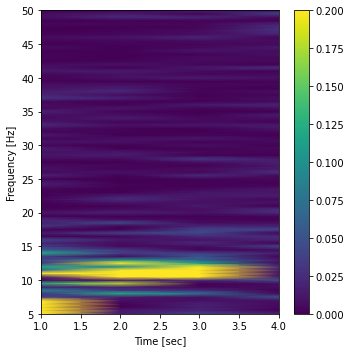

True Alpha : 23


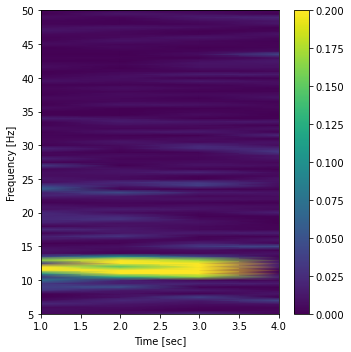

True Alpha : 24


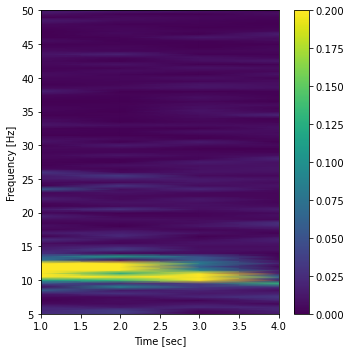

True Alpha : 25


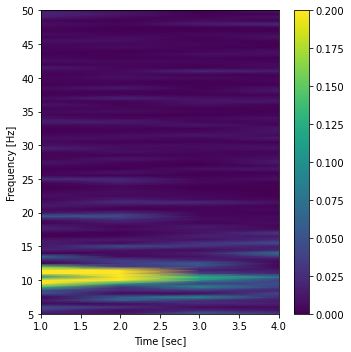

True Alpha : 26


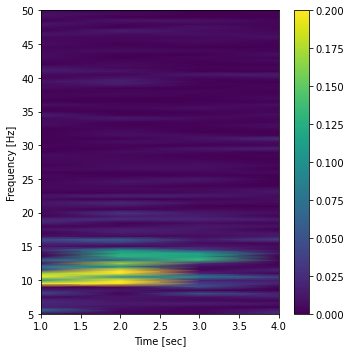

True Alpha : 27


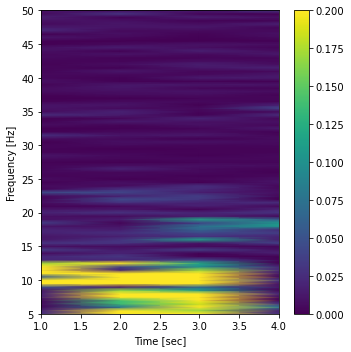

True Alpha : 28


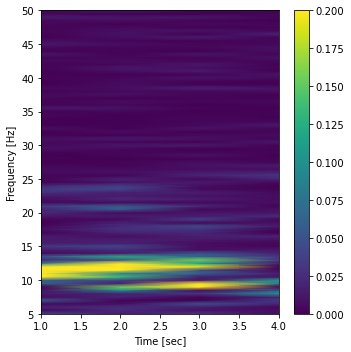

True Alpha : 29


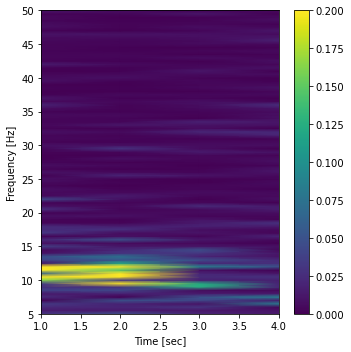

True Alpha : 30


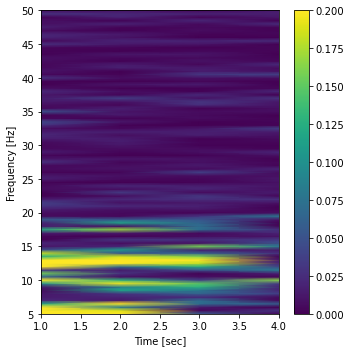

True Alpha : 31


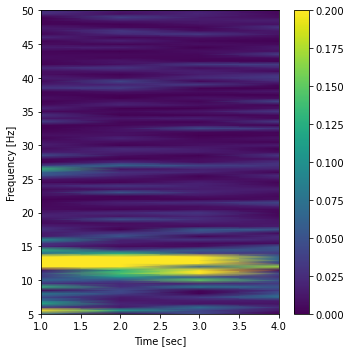

True Alpha : 32


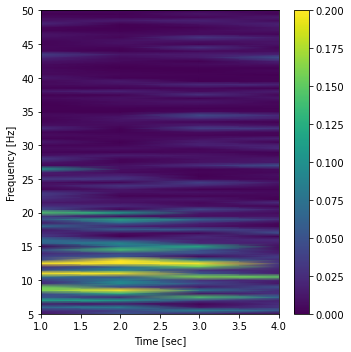

True Alpha : 33


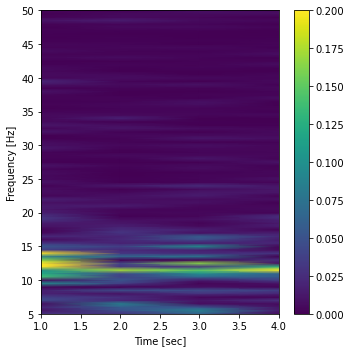

True Alpha : 34


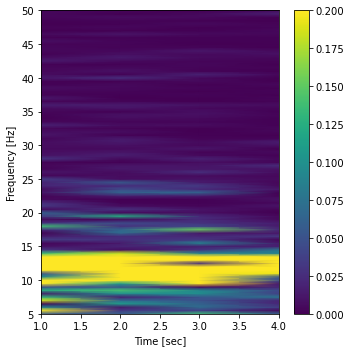

True Alpha : 35


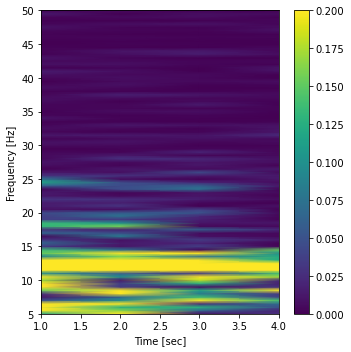

True Alpha : 36


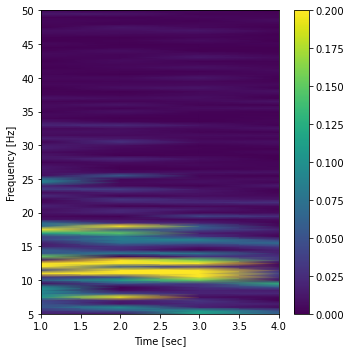

True Alpha : 37


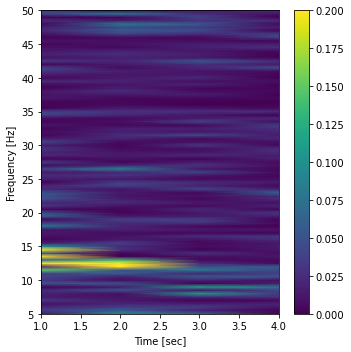

True Alpha : 38


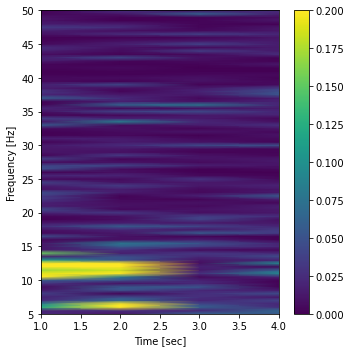

True Alpha : 39


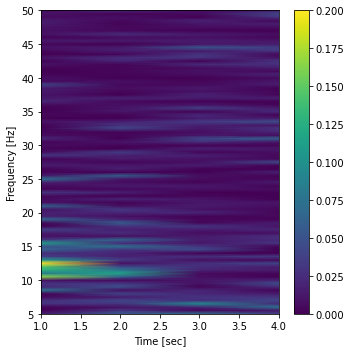

True Alpha : 40


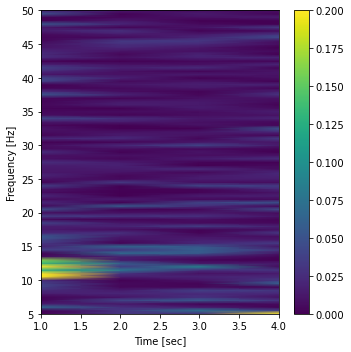

True Alpha : 41


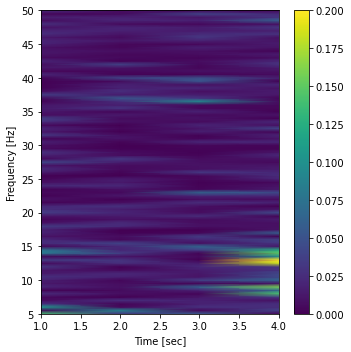

True Alpha : 42


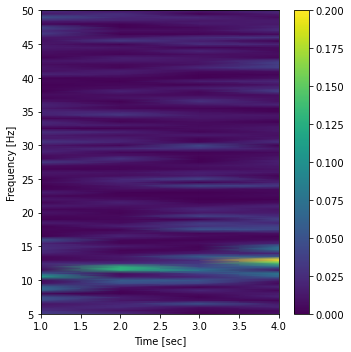

True Alpha : 43


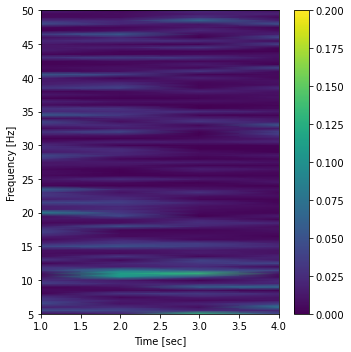

In [13]:
eegData.plot_all_alpha_spectrograms(vmax=0.2)

In [14]:
eegData.create_SSVEP_spectrograms(nperseg=4000, noverlap=3800)

False SSVEP : 0


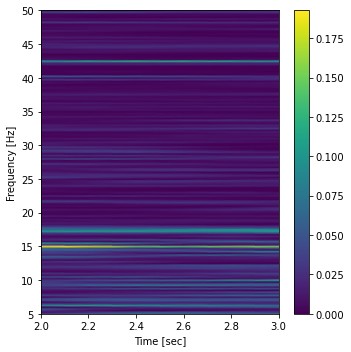

False SSVEP : 1


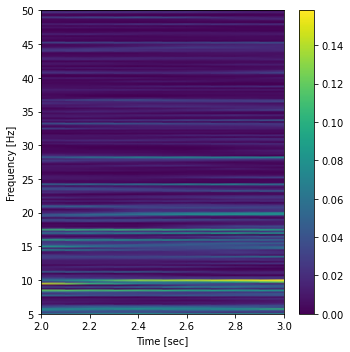

False SSVEP : 2


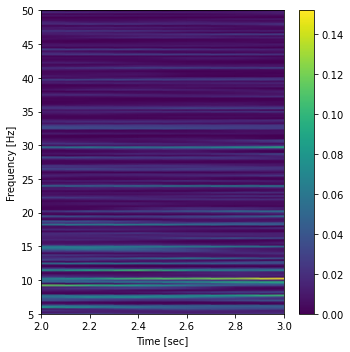

False SSVEP : 3


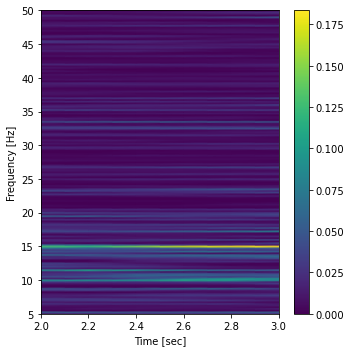

False SSVEP : 4


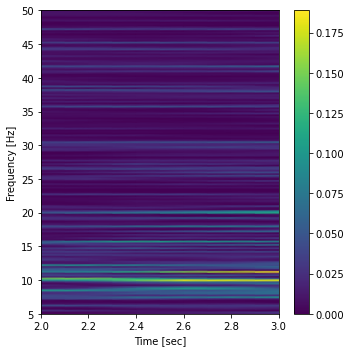

False SSVEP : 5


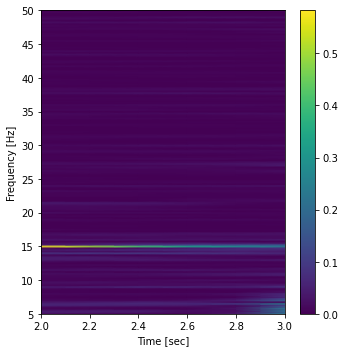

False SSVEP : 6


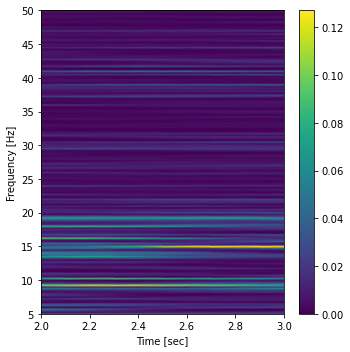

False SSVEP : 7


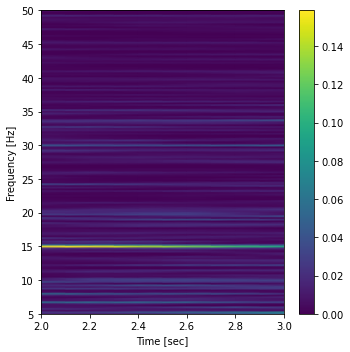

False SSVEP : 8


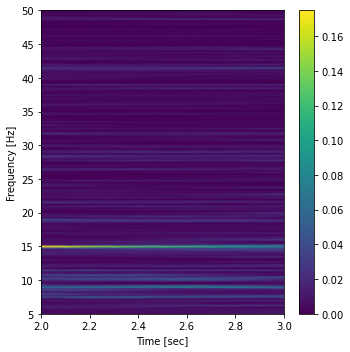

False SSVEP : 9


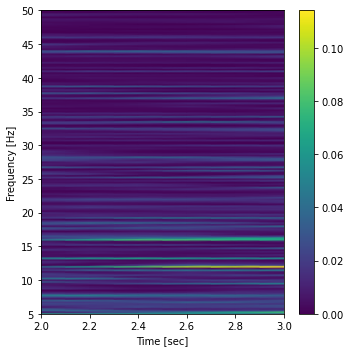

False SSVEP : 10


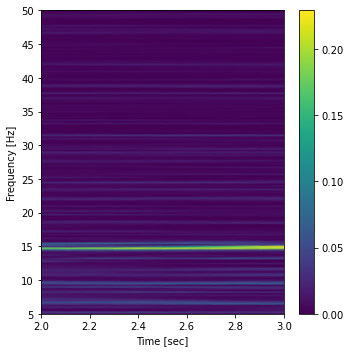

False SSVEP : 11


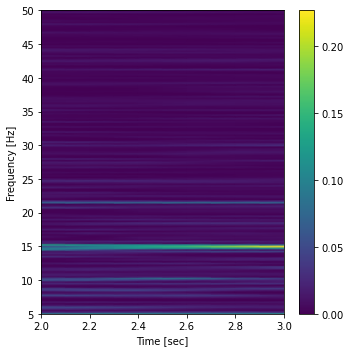

False SSVEP : 12


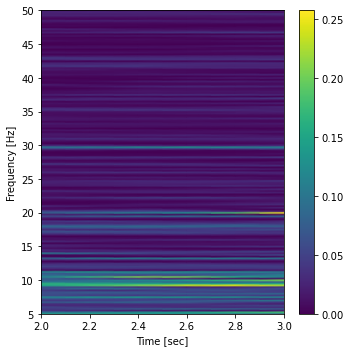

False SSVEP : 13


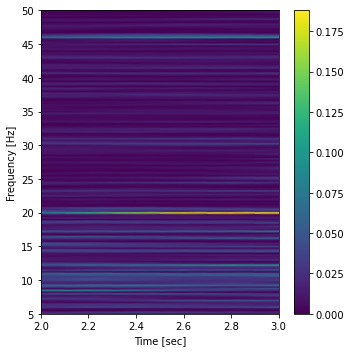

False SSVEP : 14


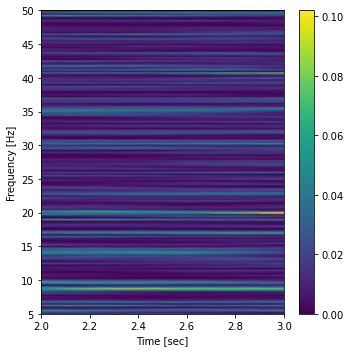

False SSVEP : 15


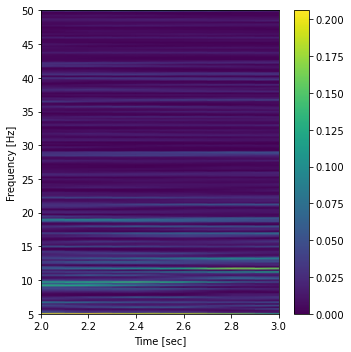

False SSVEP : 16


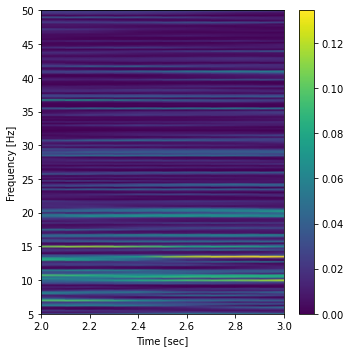

False SSVEP : 17


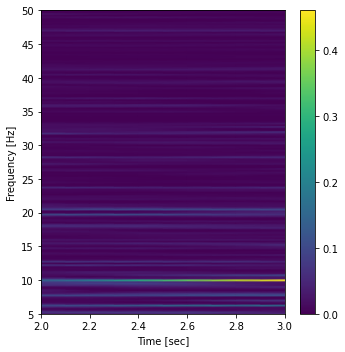

False SSVEP : 18


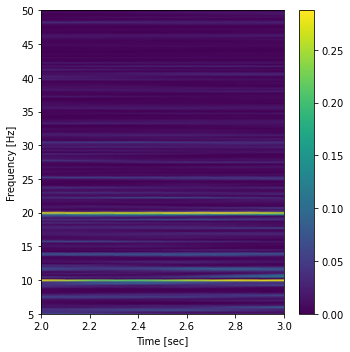

False SSVEP : 19


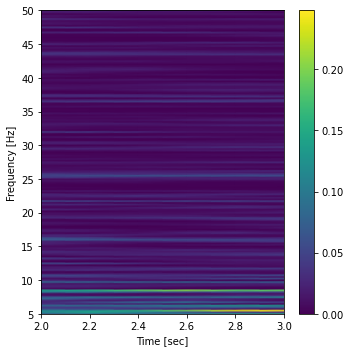

False SSVEP : 20


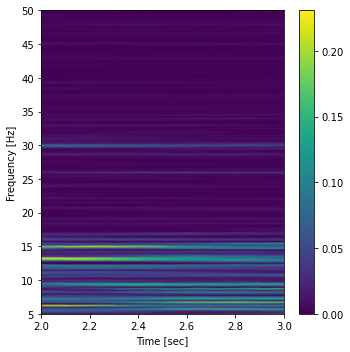

False SSVEP : 21


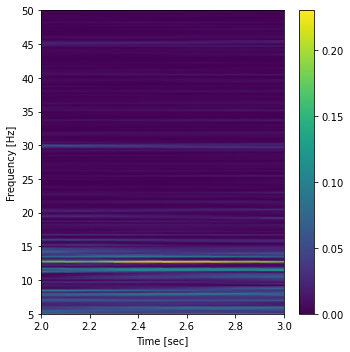

False SSVEP : 22


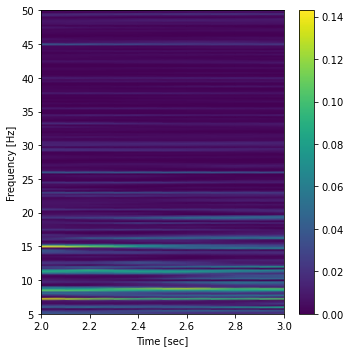

False SSVEP : 23


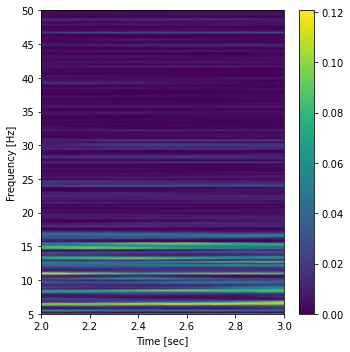

False SSVEP : 24


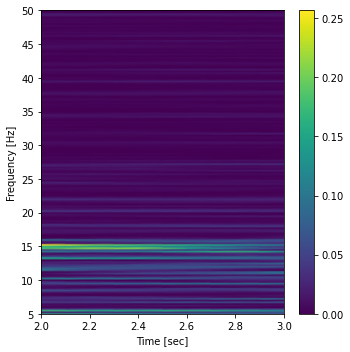

False SSVEP : 25


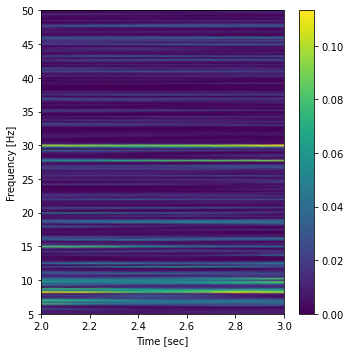

False SSVEP : 26


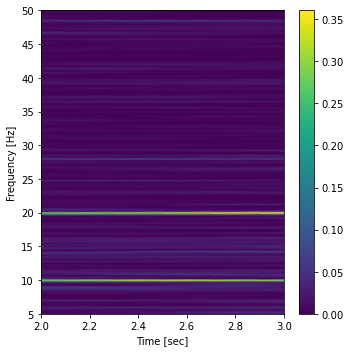

False SSVEP : 27


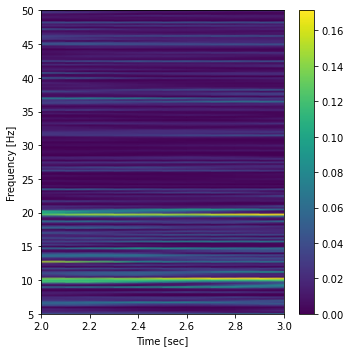

False SSVEP : 28


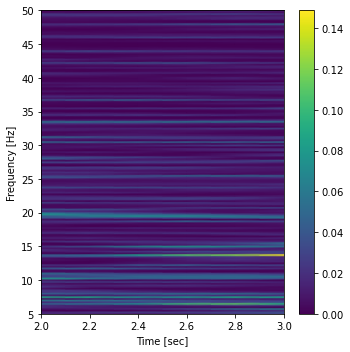

False SSVEP : 29


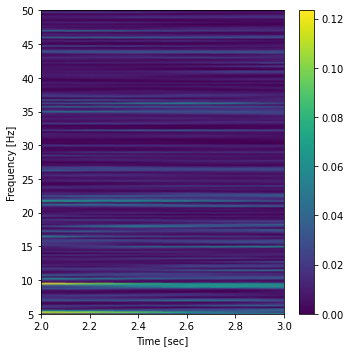

True SSVEP : 0


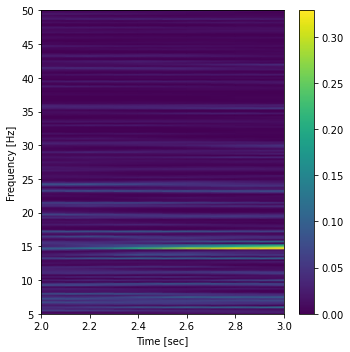

True SSVEP : 1


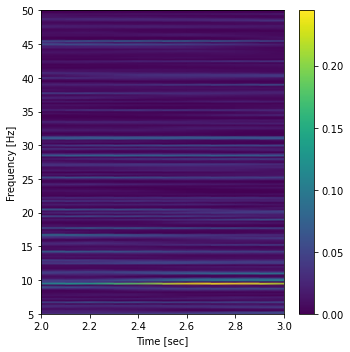

True SSVEP : 2


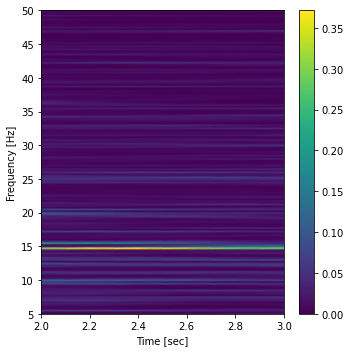

True SSVEP : 3


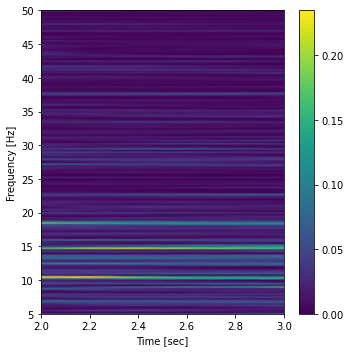

True SSVEP : 4


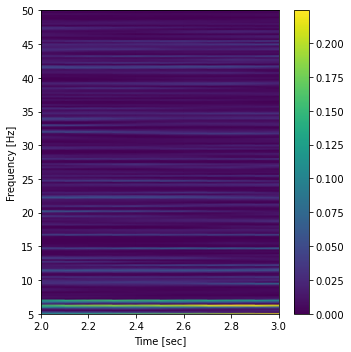

True SSVEP : 5


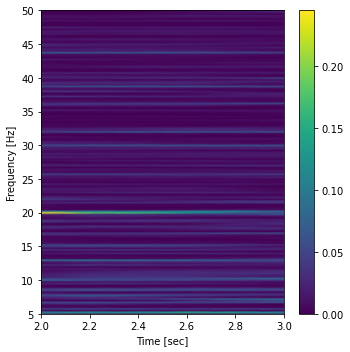

True SSVEP : 6


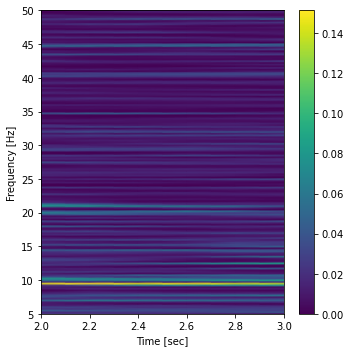

True SSVEP : 7


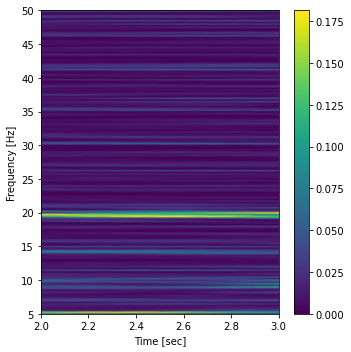

True SSVEP : 8


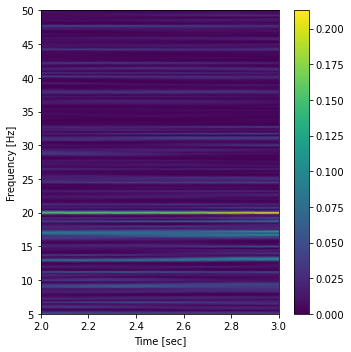

True SSVEP : 9


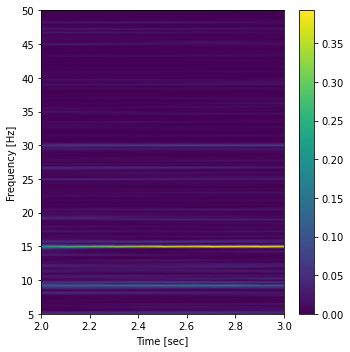

True SSVEP : 10


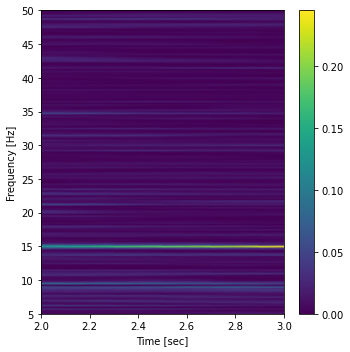

True SSVEP : 11


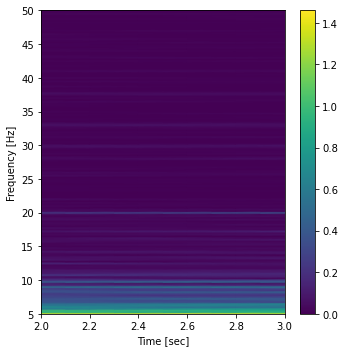

True SSVEP : 12


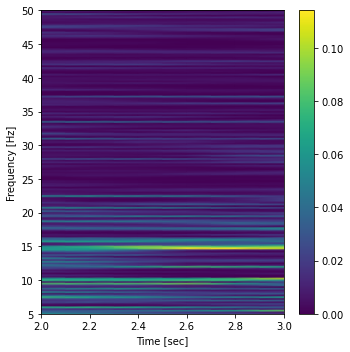

True SSVEP : 13


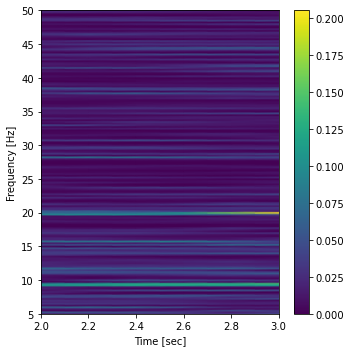

True SSVEP : 14


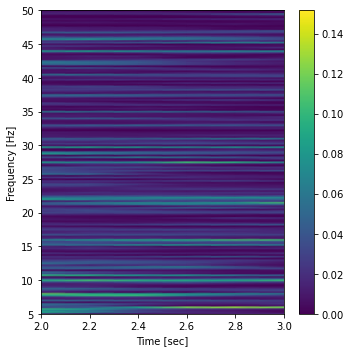

True SSVEP : 15


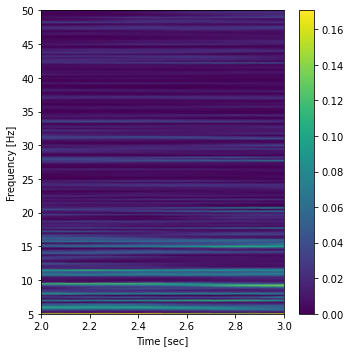

True SSVEP : 16


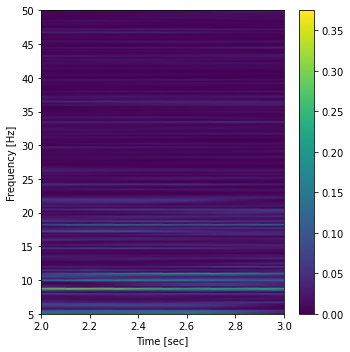

True SSVEP : 17


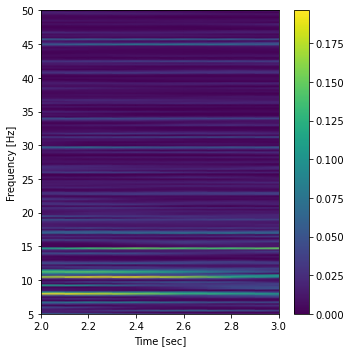

True SSVEP : 18


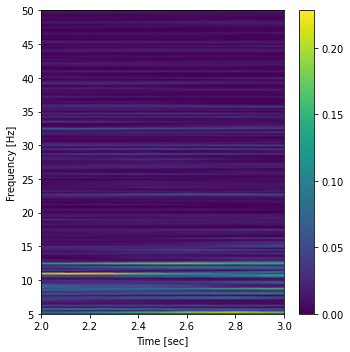

True SSVEP : 19


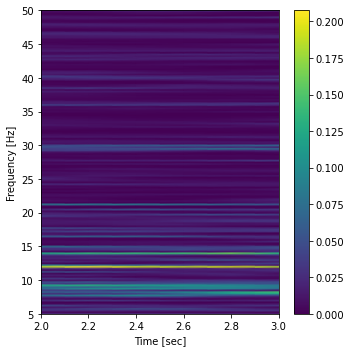

True SSVEP : 20


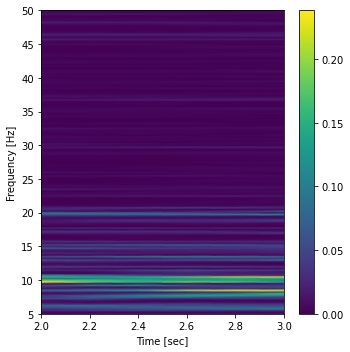

True SSVEP : 21


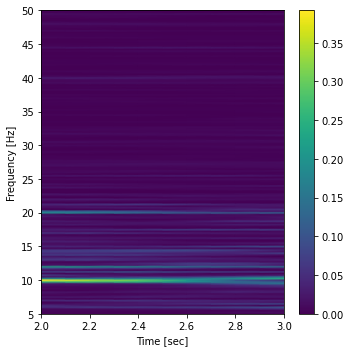

True SSVEP : 22


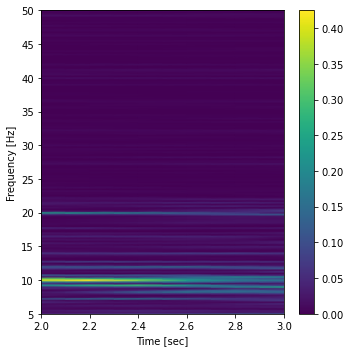

True SSVEP : 23


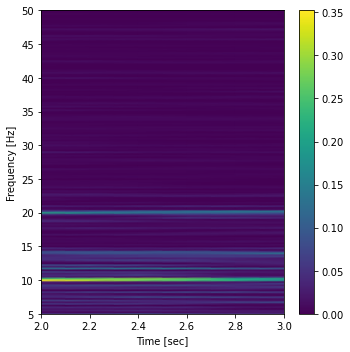

True SSVEP : 24


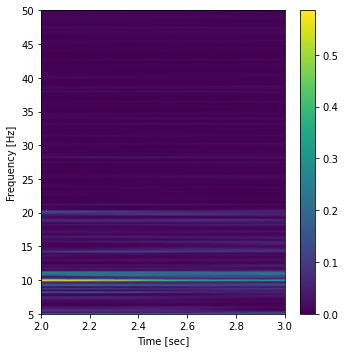

True SSVEP : 25


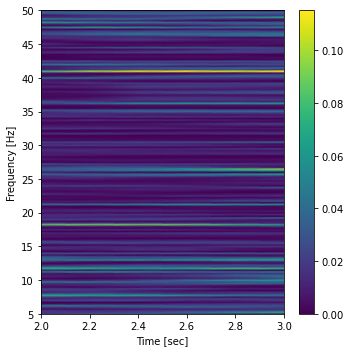

True SSVEP : 26


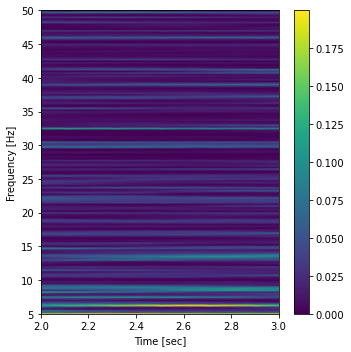

True SSVEP : 27


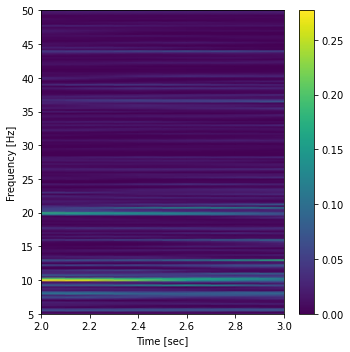

True SSVEP : 28


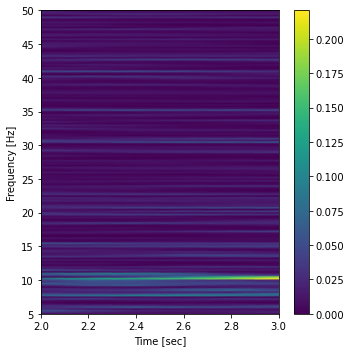

True SSVEP : 29


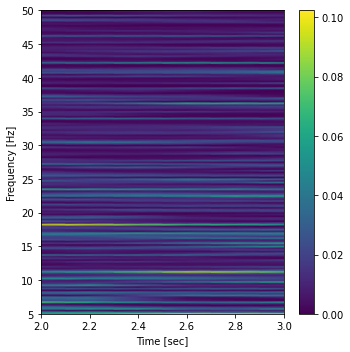

In [15]:
eegData.plot_all_SSVEP_spectrograms(vmax=None)

# SSVEP ML

In [38]:
eegData.prepare_SSVEP_data_for_ml(train_fraction=0.8)

In [40]:
eegData.fit_SSVEP_ML_and_report(use_gpu=True)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
5,Ridge Classifier,0.6042,0.0000,0.5521,0.6121,0.5777,0.2083,0.2097,0.0200
0,Extra Trees Classifier,0.5938,0.6094,0.5625,0.5999,0.5785,0.1875,0.1888,0.5833
1,Logistic Regression,0.5938,0.6038,0.4896,0.6186,0.5464,0.1875,0.1918,0.0300
4,Linear Discriminant Analysis,0.5885,0.6025,0.4583,0.6162,0.5230,0.1771,0.1827,0.0333
6,K Neighbors Classifier,0.5885,0.5638,0.3021,0.7204,0.4216,0.1771,0.2206,0.0467
12,Quadratic Discriminant Analysis,0.5833,0.5895,0.4583,0.6128,0.5089,0.1667,0.1752,0.0300
2,Naive Bayes,0.5729,0.5879,0.4688,0.5890,0.5189,0.1458,0.1492,0.0133
10,Light Gradient Boosting Machine,0.5677,0.5736,0.6354,0.5600,0.5942,0.1354,0.1373,1.2567
8,SVM - Linear Kernel,0.5573,0.0000,0.2396,0.6712,0.3493,0.1146,0.1529,0.0167
3,Random Forest Classifier,0.5365,0.5514,0.5104,0.5308,0.5139,0.0729,0.0727,0.6633


In [41]:
eegData.best_SSVEP_clf

RidgeClassifier(alpha=4.5563805480471755, class_weight=None, copy_X=True,
                fit_intercept=True, max_iter=None, normalize=True,
                random_state=3076, solver='auto', tol=0.001)

In [42]:
eegData.best_SSVEP_clf.score(eegData.SSVEP_train_df.drop(['target', 'group'], axis=1), eegData.SSVEP_train_df['target'])

0.7239583333333334

In [43]:
eegData.best_SSVEP_clf.score(eegData.SSVEP_test_df.drop(['target', 'group'], axis=1), eegData.SSVEP_test_df['target'])

0.625

# Laryngeal ML (frequency component)

### Laryngeal Actual

In [44]:
eegData.create_LMI_a_spectrograms()
eegData.prepare_LMI_a_data_for_ml(train_fraction=0.8)

In [45]:
eegData.fit_LMI_a_ML_and_report(use_gpu=True)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
1,Linear Discriminant Analysis,0.5833,0.5936,0.5938,0.5803,0.5868,0.1667,0.1669,0.0500
2,Gradient Boosting Classifier,0.5625,0.5179,0.6250,0.5593,0.5891,0.1250,0.1258,0.3000
7,Quadratic Discriminant Analysis,0.5469,0.5173,0.3958,0.5645,0.4420,0.0938,0.0987,0.0333
9,Light Gradient Boosting Machine,0.5417,0.5469,0.5833,0.5347,0.5535,0.0833,0.0868,0.9633
0,Ada Boost Classifier,0.5365,0.5833,0.6042,0.5327,0.5656,0.0729,0.0737,0.6800
5,Decision Tree Classifier,0.5365,0.5254,0.5312,0.5361,0.5332,0.0729,0.0730,0.0500
12,K Neighbors Classifier,0.5365,0.5260,0.3125,0.5684,0.4022,0.0729,0.0825,0.0667
8,Ridge Classifier,0.5312,0.0000,0.5417,0.5319,0.5366,0.0625,0.0625,0.0233
10,Extra Trees Classifier,0.5260,0.5091,0.6042,0.5231,0.5605,0.0521,0.0526,1.1600
4,SVM - Linear Kernel,0.5156,0.0000,0.2083,0.5333,0.2755,0.0312,0.0369,0.0333


In [46]:
eegData.best_LMI_a_clf

LinearDiscriminantAnalysis(n_components=None, priors=None,
                           shrinkage=0.000623371495082328, solver='eigen',
                           store_covariance=False, tol=0.0001)

In [47]:
eegData.best_LMI_a_clf.score(eegData.LMI_a_train_df.drop(['target', 'group'], axis=1), eegData.LMI_a_train_df['target'])

0.875

In [48]:
eegData.best_LMI_a_clf.score(eegData.LMI_a_test_df.drop(['target', 'group'], axis=1), eegData.LMI_a_test_df['target'])

0.4375

In [52]:
lmi_a_model = pyclf.create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.4531,0.4434,0.5625,0.4615,0.5070,-0.0938,-0.0961
1,0.5469,0.5742,0.5625,0.5455,0.5538,0.0938,0.0938
2,0.5625,0.5498,0.5312,0.5667,0.5484,0.1250,0.1252
Mean,0.5208,0.5225,0.5521,0.5246,0.5364,0.0417,0.0410
SD,0.0483,0.0568,0.0147,0.0454,0.0209,0.0966,0.0978


In [53]:
tuned_lmi_a_model = pyclf.tune_model(lmi_a_model, search_library='scikit-optimize', groups=eegData.LMI_a_train_df.group)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5312,0.5176,0.5938,0.5278,0.5588,0.0625,0.0630
1,0.5469,0.5244,0.5625,0.5455,0.5538,0.0938,0.0938
2,0.5938,0.5684,0.5312,0.6071,0.5667,0.1875,0.1890
Mean,0.5573,0.5368,0.5625,0.5601,0.5598,0.1146,0.1153
SD,0.0266,0.0225,0.0255,0.0340,0.0053,0.0531,0.0536


In [54]:
tuned_lmi_a_model.score(eegData.LMI_a_train_df.drop(['target', 'group'], axis=1), eegData.LMI_a_train_df['target'])

1.0

In [55]:
tuned_lmi_a_model.score(eegData.LMI_a_test_df.drop(['target', 'group'], axis=1), eegData.LMI_a_test_df['target'])

0.5

In [113]:
groups = eegData.LMI_a_train_df.group
pyclf.setup(data=eegData.LMI_a_train_df.drop('group', axis=1),
            test_data=eegData.LMI_a_test_df.drop('group', axis=1),
            target='target',
            use_gpu=True,
            fold_strategy='groupkfold',
            fold_groups=groups,
            fold=3,
            silent=True)

,Description,Value
0,session_id,6997
1,Target,target
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(192, 92)"
5,Missing Values,False
6,Numeric Features,91
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


(6997,
 {'lr': <pycaret.containers.models.classification.LogisticRegressionClassifierContainer at 0x2d817303850>,
  'knn': <pycaret.containers.models.classification.KNeighborsClassifierContainer at 0x2d8172c0be0>,
  'nb': <pycaret.containers.models.classification.GaussianNBClassifierContainer at 0x2d8172c0d60>,
  'dt': <pycaret.containers.models.classification.DecisionTreeClassifierContainer at 0x2d817482fd0>,
  'svm': <pycaret.containers.models.classification.SGDClassifierContainer at 0x2d817482b50>,
  'rbfsvm': <pycaret.containers.models.classification.SVCClassifierContainer at 0x2d8172ccfa0>,
  'gpc': <pycaret.containers.models.classification.GaussianProcessClassifierContainer at 0x2d8172d0f10>,
  'mlp': <pycaret.containers.models.classification.MLPClassifierContainer at 0x2d8172d0880>,
  'ridge': <pycaret.containers.models.classification.RidgeClassifierContainer at 0x2d8172c3e80>,
  'rf': <pycaret.containers.models.classification.RandomForestClassifierContainer at 0x2d8172c3af0>,
 

In [114]:
model = pyclf.create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.4375,0.4375,0.3750,0.4286,0.4000,-0.1250,-0.1260
1,0.5312,0.5312,0.6250,0.5263,0.5714,0.0625,0.0636
2,0.5000,0.5000,0.5000,0.5000,0.5000,0.0000,0.0000
Mean,0.4896,0.4896,0.5000,0.4850,0.4905,-0.0208,-0.0208
SD,0.0390,0.0390,0.1021,0.0413,0.0703,0.0780,0.0788


In [115]:
model = pyclf.tune_model(model, search_library='scikit-optimize')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5625,0.5591,0.5938,0.5588,0.5758,0.1250,0.1252
1,0.5469,0.5117,0.4688,0.5556,0.5085,0.0938,0.0949
2,0.5312,0.4775,0.1875,0.6000,0.2857,0.0625,0.0861
Mean,0.5469,0.5161,0.4167,0.5715,0.4566,0.0938,0.1021
SD,0.0128,0.0334,0.1699,0.0202,0.1240,0.0255,0.0168


In [116]:
model.score(eegData.LMI_a_train_df.drop(['target', 'group'], axis=1), eegData.LMI_a_train_df['target'])

0.5729166666666666

In [117]:
model.score(eegData.LMI_a_test_df.drop(['target', 'group'], axis=1), eegData.LMI_a_test_df['target'])

0.4791666666666667

### Laryngeal Imagination 

In [49]:
eegData.create_LMI_i_spectrograms()
eegData.prepare_LMI_i_data_for_ml(train_fraction=0.8)

In [50]:
eegData.fit_LMI_i_ML_and_report(use_gpu=True)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
0,Extra Trees Classifier,0.5619,0.5276,0.5690,0.5614,0.5546,0.1238,0.1270,1.1967
10,Gradient Boosting Classifier,0.5548,0.5291,0.5214,0.5654,0.5384,0.1095,0.1118,0.1167
7,K Neighbors Classifier,0.5417,0.5122,0.5167,0.5601,0.5335,0.0833,0.0856,0.0500
2,Ada Boost Classifier,0.5393,0.5084,0.6119,0.5353,0.5703,0.0786,0.0790,0.7833
1,Naive Bayes,0.5357,0.5649,0.7762,0.5313,0.6233,0.0714,0.0677,0.0367
3,Random Forest Classifier,0.5298,0.5342,0.5429,0.5415,0.5318,0.0595,0.0643,1.4767
5,Light Gradient Boosting Machine,0.5226,0.5619,0.5429,0.5193,0.5269,0.0452,0.0471,2.9367
11,Decision Tree Classifier,0.5214,0.4968,0.3500,0.5486,0.4255,0.0429,0.0511,0.0200
8,SVM - Linear Kernel,0.5179,0.0000,0.0595,0.2381,0.0952,0.0357,0.0540,0.0167
4,Ridge Classifier,0.5119,0.0000,0.7095,0.5067,0.5397,0.0238,0.0385,0.0233


In [32]:
eegData.best_LMI_i_clf

LinearDiscriminantAnalysis(n_components=None, priors=None,
                           shrinkage=0.0015821864983074922, solver='lsqr',
                           store_covariance=False, tol=0.0001)

In [24]:
eegData.LI_spectrograms_true[0].spectrograms.shape

(1001, 4)

In [59]:
lgbm = pyclf.create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5536,0.5370,0.4286,0.5714,0.4898,0.1071,0.1107
1,0.5500,0.5050,0.5500,0.5500,0.5500,0.1000,0.1000
2,0.3750,0.3550,0.3500,0.3684,0.3590,-0.2500,-0.2503
Mean,0.4929,0.4657,0.4429,0.4966,0.4663,-0.0143,-0.0132
SD,0.0834,0.0793,0.0823,0.0911,0.0797,0.1667,0.1677


In [34]:
eegData.LI_spectrograms_true[0].frequencies[10:61]

array([ 5. ,  5.5,  6. ,  6.5,  7. ,  7.5,  8. ,  8.5,  9. ,  9.5, 10. ,
       10.5, 11. , 11.5, 12. , 12.5, 13. , 13.5, 14. , 14.5, 15. , 15.5,
       16. , 16.5, 17. , 17.5, 18. , 18.5, 19. , 19.5, 20. , 20.5, 21. ,
       21.5, 22. , 22.5, 23. , 23.5, 24. , 24.5, 25. , 25.5, 26. , 26.5,
       27. , 27.5, 28. , 28.5, 29. , 29.5, 30. ])

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

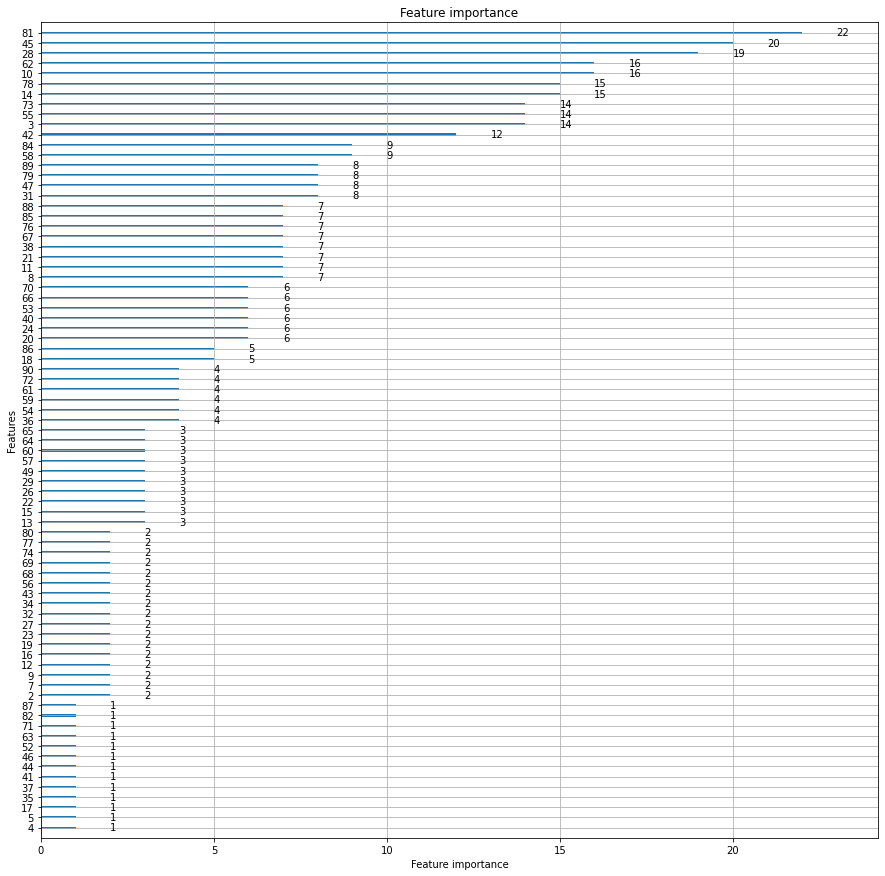

In [60]:
import lightgbm

lightgbm.plot_importance(lgbm, figsize=(15, 15))

In [22]:
model = pyclf.create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6071,0.5453,0.5000,0.6364,0.5600,0.2143,0.2194
1,0.5500,0.4512,0.5500,0.5500,0.5500,0.1000,0.1000
2,0.5500,0.4538,0.7500,0.5357,0.6250,0.1000,0.1091
Mean,0.5690,0.4834,0.6000,0.5740,0.5783,0.1381,0.1428
SD,0.0269,0.0437,0.1080,0.0445,0.0332,0.0539,0.0543


In [23]:
tuned = pyclf.tune_model(model, groups=eegData.LMI_i_train_df.group)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.4821,0.5510,0.2500,0.4667,0.3256,-0.0357,-0.0403
1,0.6250,0.6575,0.6500,0.6190,0.6341,0.2500,0.2503
2,0.6250,0.5525,0.7500,0.6000,0.6667,0.2500,0.2582
Mean,0.5774,0.5870,0.5500,0.5619,0.5421,0.1548,0.1561
SD,0.0673,0.0498,0.2160,0.0678,0.1537,0.1347,0.1389


In [27]:
tuned = eegData.best_LMI_i_clf

In [53]:
eegData.best_LMI_i_clf.fit(eegData.LMI_i_train_df.drop(['target', 'group'], axis=1), eegData.LMI_i_train_df['target'])

ExtraTreesClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                     criterion='entropy', max_depth=10,
                     max_features=0.5931424496801991, max_leaf_nodes=None,
                     max_samples=None,
                     min_impurity_decrease=0.0011838126600188298,
                     min_impurity_split=None, min_samples_leaf=4,
                     min_samples_split=10, min_weight_fraction_leaf=0.0,
                     n_estimators=252, n_jobs=-1, oob_score=False,
                     random_state=6061, verbose=0, warm_start=False)

In [51]:
eegData.best_LMI_i_clf.score(eegData.LMI_i_train_df.drop(['target', 'group'], axis=1), eegData.LMI_i_train_df['target'])

1.0

In [52]:
eegData.best_LMI_i_clf.score(eegData.LMI_i_test_df.drop(['target', 'group'], axis=1), eegData.LMI_i_test_df['target'])

0.55

In [56]:
22/40

0.55

In [58]:
eegData.LMI_i_train_df.shape

(136, 93)

In [54]:
eegData.LMI_i_test_df.shape

(40, 93)

In [80]:
groups = eegData.LMI_i_train_df.group
pyclf.setup(data=eegData.LMI_i_train_df.drop('group', axis=1),
            test_data=eegData.LMI_i_test_df.drop('group', axis=1),
            target='target',
            use_gpu=True,
            fold_strategy='groupkfold',
            fold_groups=groups,
            fold=3,
            silent=True)

,Description,Value
0,session_id,6982
1,Target,target
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(136, 92)"
5,Missing Values,False
6,Numeric Features,91
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


(6982,
 {'lr': <pycaret.containers.models.classification.LogisticRegressionClassifierContainer at 0x2d81607eee0>,
  'knn': <pycaret.containers.models.classification.KNeighborsClassifierContainer at 0x2d81607ecd0>,
  'nb': <pycaret.containers.models.classification.GaussianNBClassifierContainer at 0x2d81607ef70>,
  'dt': <pycaret.containers.models.classification.DecisionTreeClassifierContainer at 0x2d81607ed90>,
  'svm': <pycaret.containers.models.classification.SGDClassifierContainer at 0x2d81607e550>,
  'rbfsvm': <pycaret.containers.models.classification.SVCClassifierContainer at 0x2d81606f7c0>,
  'gpc': <pycaret.containers.models.classification.GaussianProcessClassifierContainer at 0x2d816181e20>,
  'mlp': <pycaret.containers.models.classification.MLPClassifierContainer at 0x2d816181cd0>,
  'ridge': <pycaret.containers.models.classification.RidgeClassifierContainer at 0x2d816181610>,
  'rf': <pycaret.containers.models.classification.RandomForestClassifierContainer at 0x2d8161813a0>,
 

In [92]:
model = pyclf.create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5714,0.5313,0.3929,0.6111,0.4783,0.1429,0.1529
1,0.4500,0.4300,0.5500,0.4583,0.5000,-0.1000,-0.1021
2,0.3750,0.3888,0.5500,0.4074,0.4681,-0.2500,-0.2669
Mean,0.4655,0.4500,0.4976,0.4923,0.4821,-0.0690,-0.0720
SD,0.0809,0.0599,0.0741,0.0866,0.0133,0.1619,0.1727


In [93]:
model = pyclf.tune_model(model, search_library='scikit-optimize')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5714,0.5880,0.2857,0.6667,0.4000,0.1429,0.1741
1,0.6750,0.6300,0.5000,0.7692,0.6061,0.3500,0.3736
2,0.4750,0.4738,0.5500,0.4783,0.5116,-0.0500,-0.0506
Mean,0.5738,0.5639,0.4452,0.6381,0.5059,0.1476,0.1657
SD,0.0817,0.0660,0.1146,0.1205,0.0842,0.1633,0.1733


In [94]:
model.score(eegData.LMI_i_train_df.drop(['target', 'group'], axis=1), eegData.LMI_i_train_df['target'])

0.6544117647058824

In [95]:
model.score(eegData.LMI_i_test_df.drop(['target', 'group'], axis=1), eegData.LMI_i_test_df['target'])

0.5

## Check spectrograms in order

In [21]:
eegData.get_all_epochs()

In [25]:
eegData.data.ch_names

['Fp1',
 'Fp2',
 'CP1',
 'CP2',
 'FC1',
 'FC2',
 'O1',
 'O2',
 'F7',
 'F8',
 'Fz',
 'Cz',
 'T3',
 'T4',
 'P3',
 'P4']

In [26]:
o_chns = eegData.SSVEP_epochs.get_data()[:, 6:8, :]

2


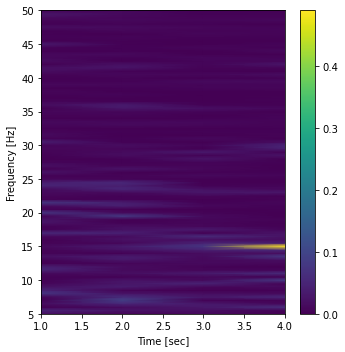

1


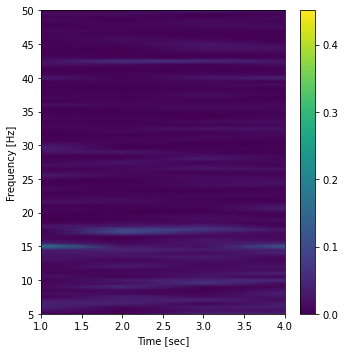

1


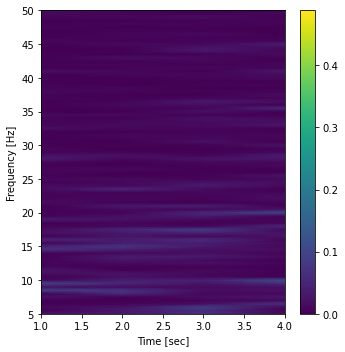

2


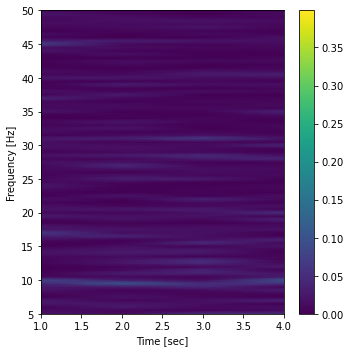

2


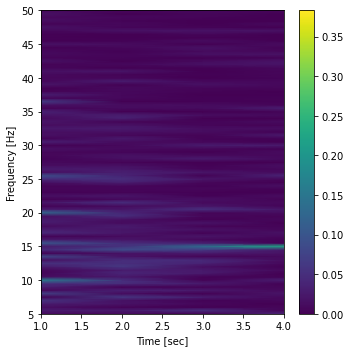

1


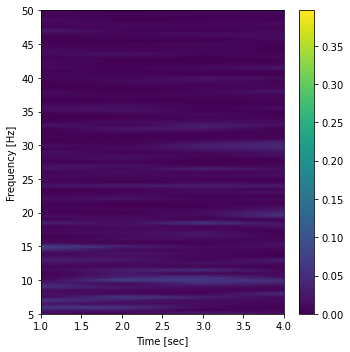

2


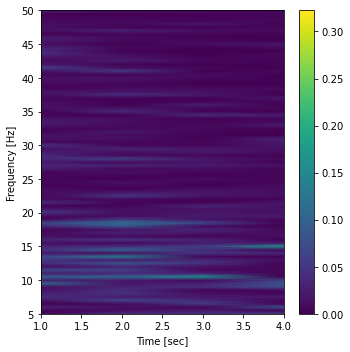

1


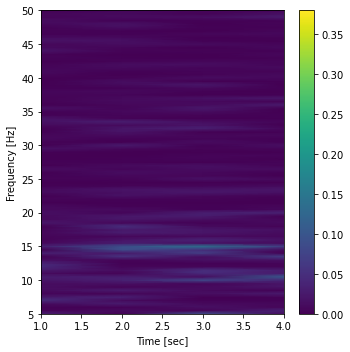

1


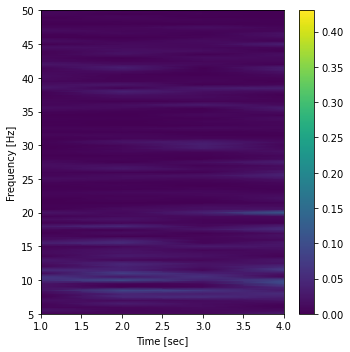

2


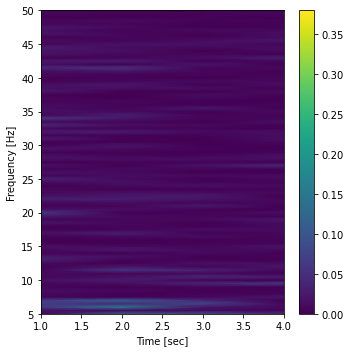

1


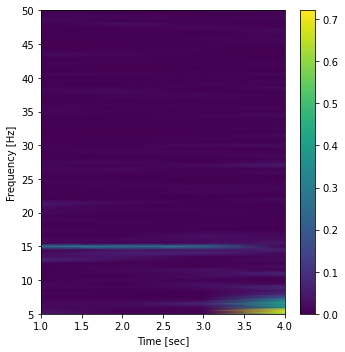

2


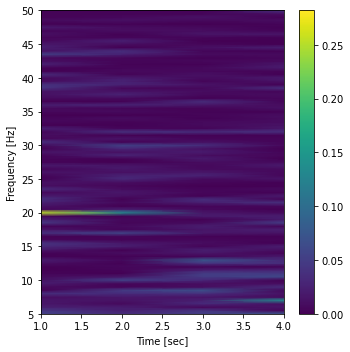

2


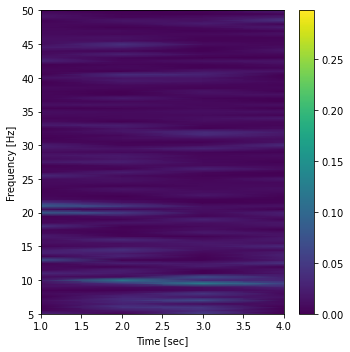

2


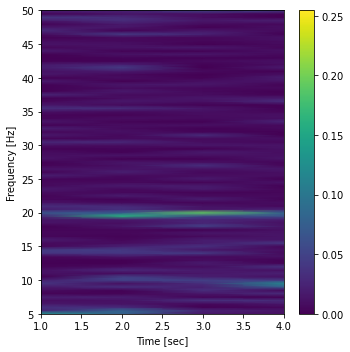

2


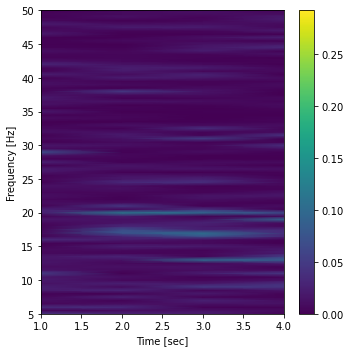

2


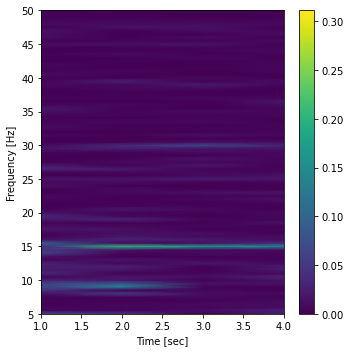

1


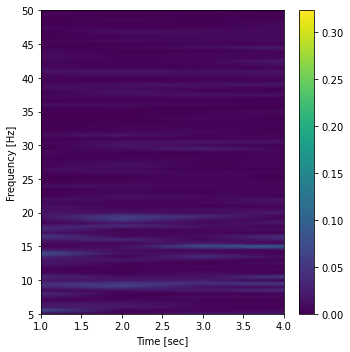

1


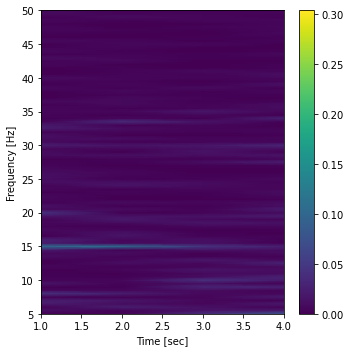

1


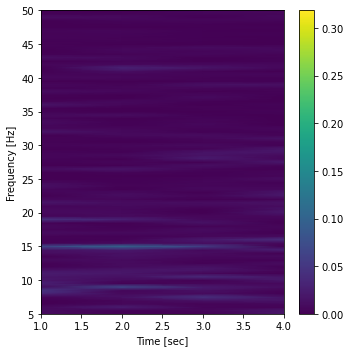

1


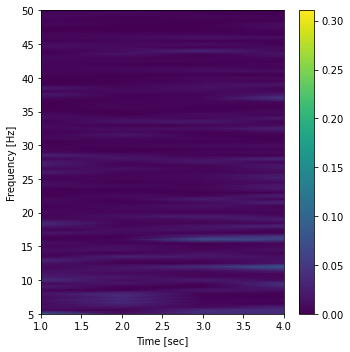

1


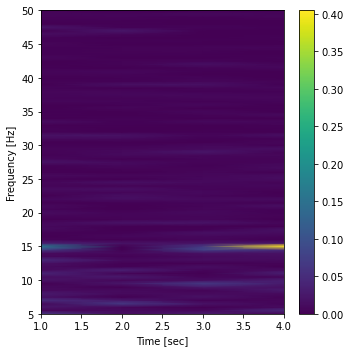

1


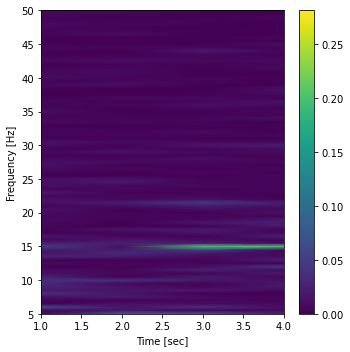

1


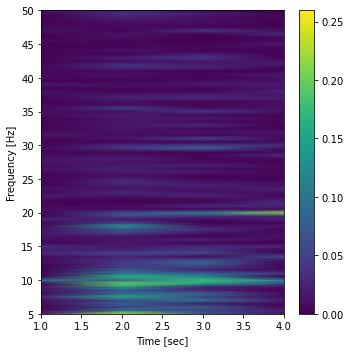

2


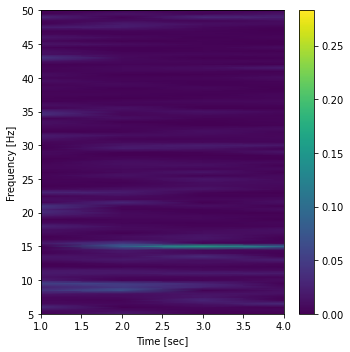

1


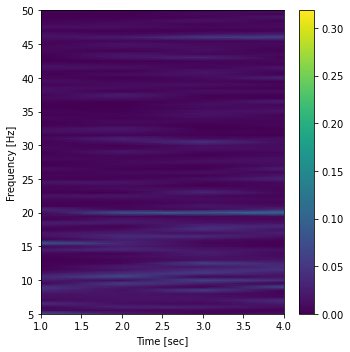

2


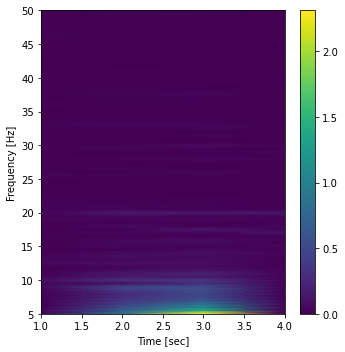

2


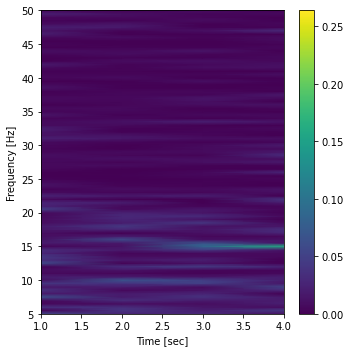

1


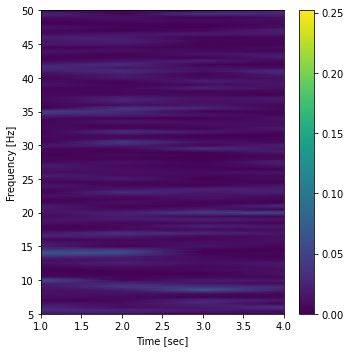

2


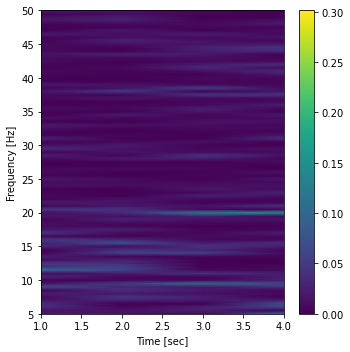

2


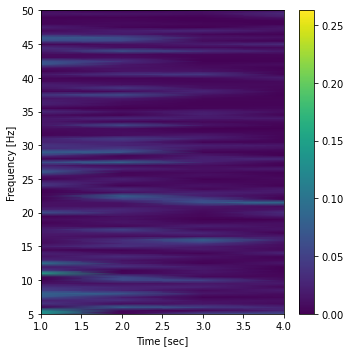

1


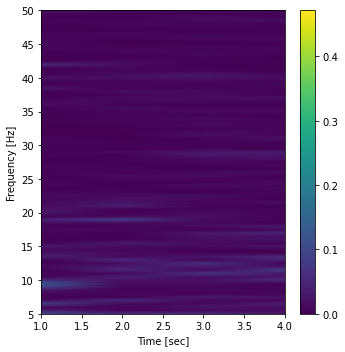

2


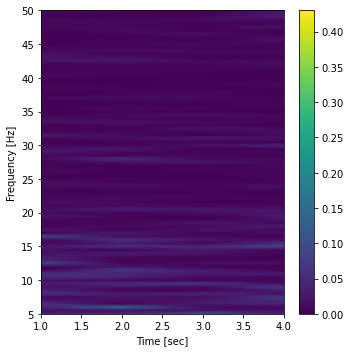

1


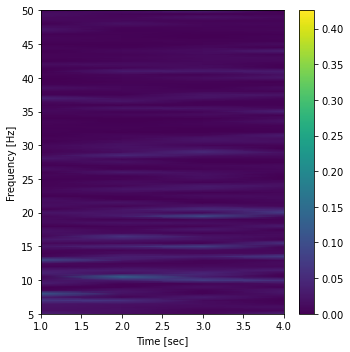

2


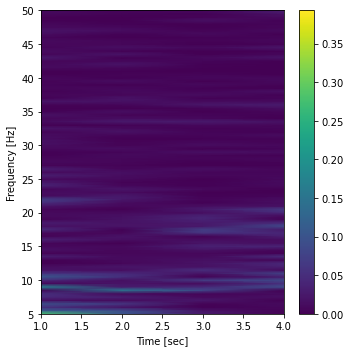

2


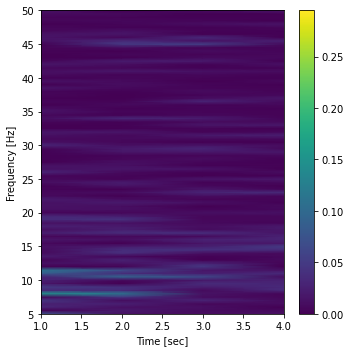

1


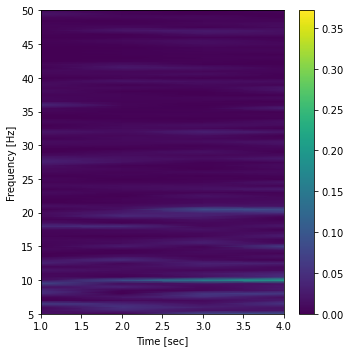

2


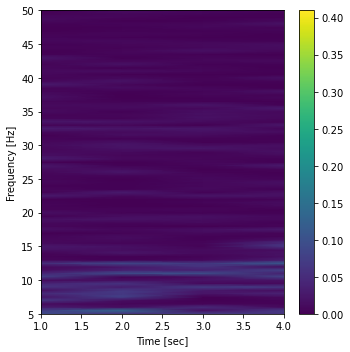

1


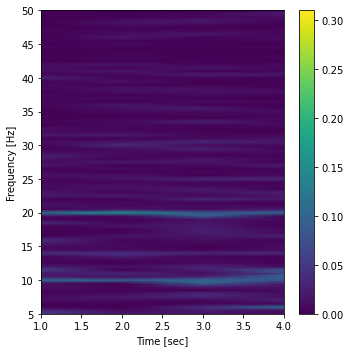

2


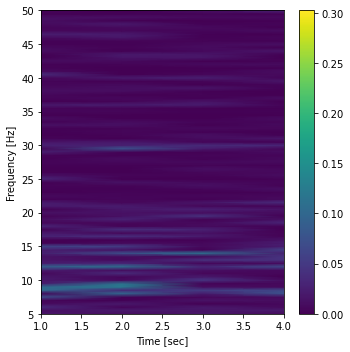

1


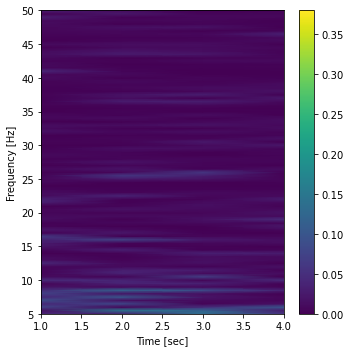

1


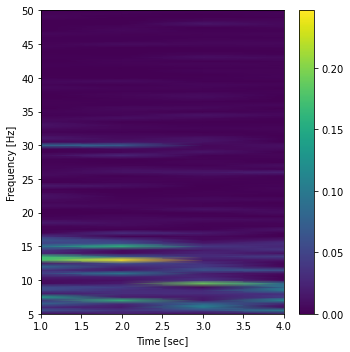

1


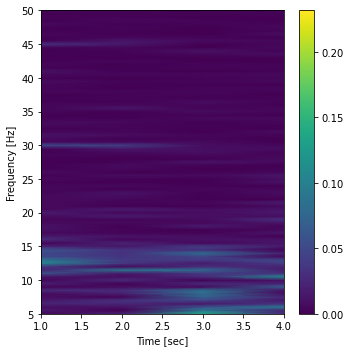

2


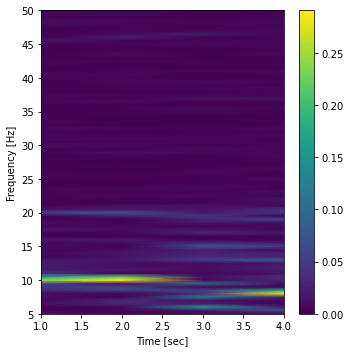

2


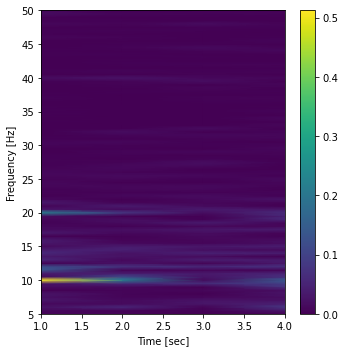

2


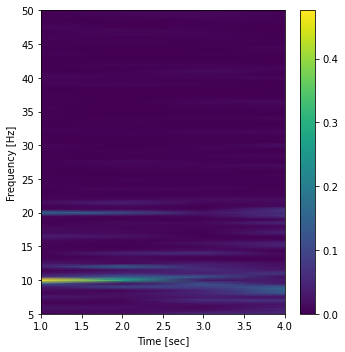

2


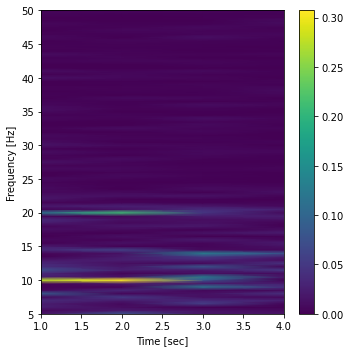

1


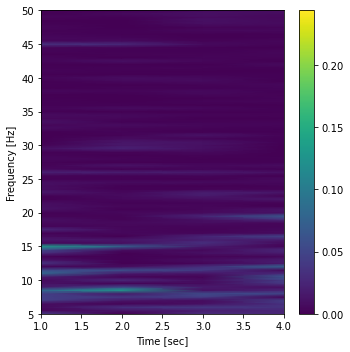

2


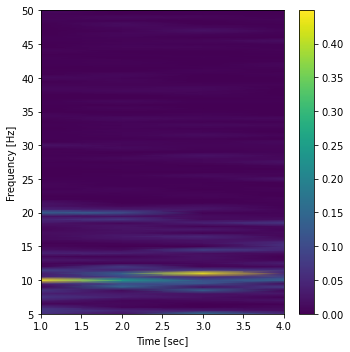

1


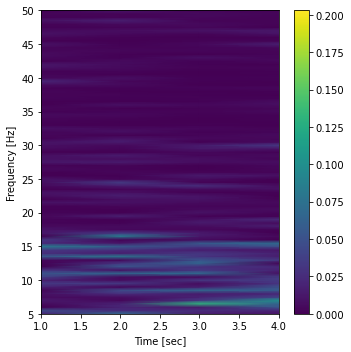

1


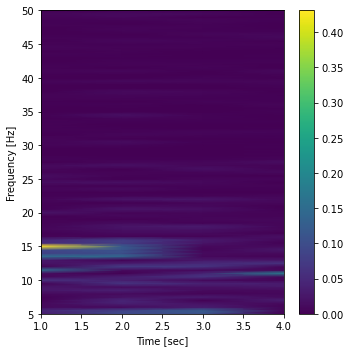

1


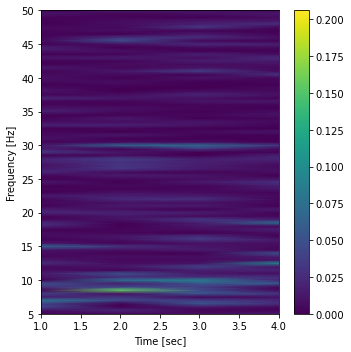

1


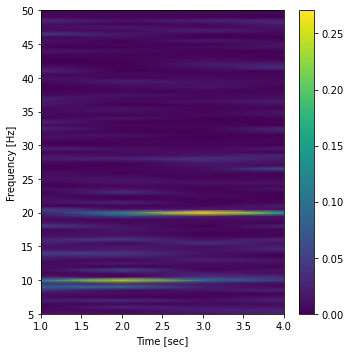

2


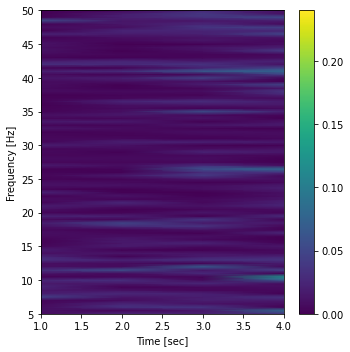

1


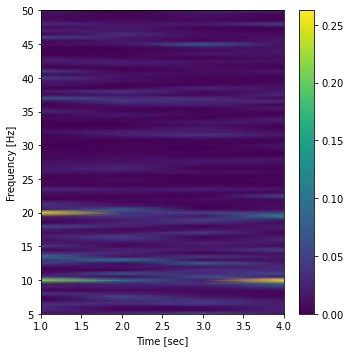

2


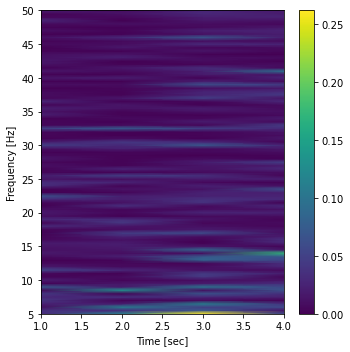

2


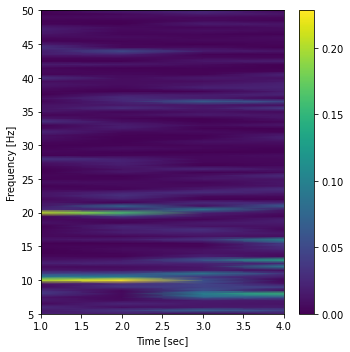

2


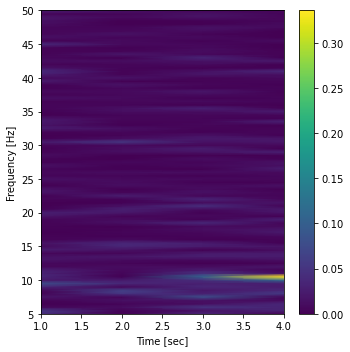

1


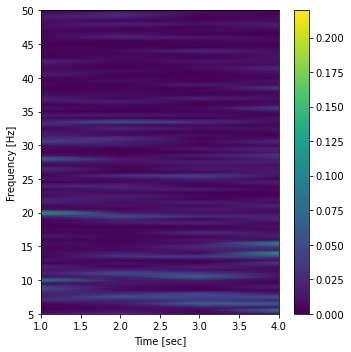

2


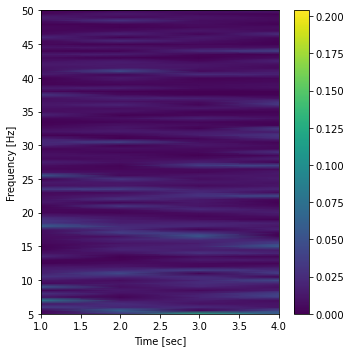

1


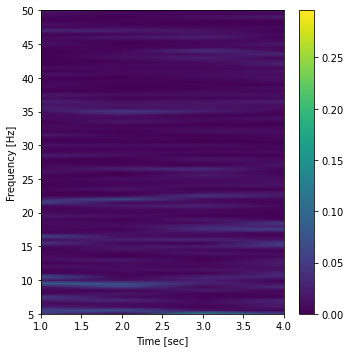

In [58]:
for ev_id, exp in zip(eegData.SSVEP_epochs.events[:, -1], range(o_chns.shape[0])):
    frequencies, times, spectrogram = spsig.spectrogram(o_chns[exp, 0, :],
                                                                fs=1000,
                                                                nperseg=2000,
                                                                noverlap=1000)
    sd = dpp.spectrogramData(spectrogram, frequencies, times)
    print(ev_id)
    eegData.plot_spectrogram(sd)

# Machine learning - motor actual movement

In [167]:
eegData.fit_motor_actual_and_report()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
3,Decision Tree Classifier,0.8083,0.4520,0.4722,0.5505,0.5078,nan,0.2425,0.0133
0,Naive Bayes,0.6792,0.3291,0.6093,0.4345,0.5037,-0.0051,-0.0354,0.0167
1,Quadratic Discriminant Analysis,0.5875,0.3018,0.5556,0.4251,0.4793,-0.0450,-0.0616,0.0133
4,Ada Boost Classifier,0.4958,0.4935,0.5444,0.5368,0.5322,0.1770,0.1873,0.0800
6,Random Forest Classifier,0.4708,0.4694,0.5574,0.4995,0.5247,0.1998,0.2074,0.1800
12,SVM - Linear Kernel,0.4708,0.0000,0.6000,0.4279,0.4971,-0.0345,-0.0654,0.0100
7,Extra Trees Classifier,0.4583,0.4405,0.5463,0.4885,0.5156,0.1403,0.1426,0.4600
2,Gradient Boosting Classifier,0.4542,0.4046,0.5407,0.4745,0.5051,0.1239,0.1327,0.0300
5,Light Gradient Boosting Machine,0.4375,0.4272,0.6667,0.4375,0.5257,0.0000,0.0000,0.8500
8,K Neighbors Classifier,0.4000,0.4422,0.5722,0.4481,0.4893,0.0359,0.0363,0.0300


In [168]:
eegData.best_ma_clf

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=0.8160525977388366,
                       max_leaf_nodes=None,
                       min_impurity_decrease=3.1747787774641633e-09,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=3, min_weight_fraction_leaf=0.0,
                       presort='deprecated', random_state=6589,
                       splitter='best')

In [169]:
eegData.best_ma_clf.score(eegData.ma_csp_df_train.drop(['target', 'group'], axis=1), eegData.ma_csp_df_train['target'])

0.8121212121212121

In [170]:
eegData.best_ma_clf.score(eegData.ma_csp_df_test.drop(['target', 'group'], axis=1), eegData.ma_csp_df_test['target'])

0.4

In [184]:
pyclf.setup(data=eegData.ma_csp_df_train.drop('group', axis=1),
            test_data=eegData.ma_csp_df_test.drop('group', axis=1),
            target='target',
            use_gpu=True,
            fold_strategy='groupkfold',
            fold_groups=eegData.ma_csp_df_train.group,
            fold=3,
            silent=True)
model = pyclf.create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7250,0.4275,0.9500,0.7500,0.8382,0.0000,0.0000
1,0.4000,0.3549,0.6222,0.4746,0.5385,-0.2757,-0.2971
2,0.6000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Mean,0.5750,0.2608,0.5241,0.4082,0.4589,-0.0919,-0.0990
SD,0.1339,0.1868,0.3940,0.3098,0.3468,0.1300,0.1400


In [185]:
tuned_model = pyclf.tune_model(model, search_library='scikit-optimize', groups=eegData.ma_csp_df_train.group)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5625,0.5158,0.6333,0.7451,0.6847,-0.0145,-0.0150
1,0.5625,0.2362,1.0000,0.5625,0.7200,0.0000,0.0000
2,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Mean,0.3750,0.2507,0.5444,0.4359,0.4682,-0.0048,-0.0050
SD,0.2652,0.2108,0.4131,0.3171,0.3314,0.0068,0.0071


In [186]:
tuned_model

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.954683911777959,
                              store_covariance=False, tol=0.0001)

In [187]:
for k, v in tuned_model.get_params().items():
    print(k, ',', v)

priors , None
reg_param , 0.954683911777959
store_covariance , False
tol , 0.0001


In [188]:
tuned_model.score(eegData.ma_csp_df_train.drop(['target', 'group'], axis=1), eegData.ma_csp_df_train['target'])

0.6727272727272727

In [189]:
tuned_model.score(eegData.ma_csp_df_test.drop(['target', 'group'], axis=1), eegData.ma_csp_df_test['target'])

0.43703703703703706

# motor imagery

In [56]:
eegData.fit_motor_imagery_and_report()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
10,SVM - Linear Kernel,0.6708,0.0000,0.4426,0.4265,0.4245,nan,-0.0640,0.0167
4,Extra Trees Classifier,0.5958,0.3933,0.3667,0.5000,0.4153,0.0714,0.0825,0.8800
3,Decision Tree Classifier,0.5417,0.3744,0.3759,0.4926,0.4092,0.0841,0.0945,0.0200
1,Random Forest Classifier,0.5375,0.3604,0.4278,0.4809,0.4525,0.0723,0.0736,0.4467
5,K Neighbors Classifier,0.5125,0.3748,0.4185,0.4557,0.4359,0.0352,0.0347,0.0333
8,Quadratic Discriminant Analysis,0.4542,0.4213,0.5722,0.4346,0.4829,-0.0108,-0.0108,0.0167
7,Naive Bayes,0.4500,0.4022,0.5093,0.4404,0.4659,0.0107,0.0142,0.0100
9,Logistic Regression,0.4458,0.3688,0.3389,0.4940,0.3895,0.0380,0.0517,0.0167
2,Light Gradient Boosting Machine,0.4375,0.3333,0.6667,0.4375,0.5257,0.0000,0.0000,0.4567
6,Gradient Boosting Classifier,0.4375,0.3972,0.6667,0.4375,0.5257,0.0000,0.0000,0.2500


In [57]:
eegData.best_mi_clf

SGDClassifier(alpha=0.002100082654391608, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.003543476921635893,
              fit_intercept=False, l1_ratio=0.02886023049639919,
              learning_rate='optimal', loss='hinge', max_iter=1000,
              n_iter_no_change=5, n_jobs=-1, penalty='l1', power_t=0.5,
              random_state=8258, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

In [58]:
eegData.best_mi_clf.score(eegData.mi_csp_df_train.drop(['target', 'group'], axis=1), eegData.mi_csp_df_train['target'])

0.4121212121212121

In [59]:
eegData.best_mi_clf.score(eegData.mi_csp_df_test.drop(['target', 'group'], axis=1), eegData.mi_csp_df_test['target'])

0.6074074074074074

In [236]:
lr = pyclf.create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5750,0.5600,0.6833,0.7321,0.7069,-0.0625,-0.0630
1,0.5625,0.5441,1.0000,0.5625,0.7200,0.0000,0.0000
2,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Mean,0.3792,0.3680,0.5611,0.4315,0.4756,-0.0208,-0.0210
SD,0.2682,0.2603,0.4173,0.3129,0.3364,0.0295,0.0297


In [238]:
tuned_lr = pyclf.tune_model(lr, search_library='scikit-optimize')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6000,0.5525,0.6500,0.7800,0.7091,0.0857,0.0894
1,0.5625,0.6044,1.0000,0.5625,0.7200,0.0000,0.0000
2,0.2000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Mean,0.4542,0.3856,0.5500,0.4475,0.4764,0.0286,0.0298
SD,0.1804,0.2735,0.4143,0.3287,0.3369,0.0404,0.0422


In [240]:
tuned_lr.score(eegData.mi_csp_df_train.drop(['target'], axis=1), eegData.mi_csp_df_train['target'])

0.6666666666666666

In [239]:
tuned_lr.score(eegData.mi_csp_df_test.drop(['target'], axis=1), eegData.mi_csp_df_test['target'])

0.6074074074074074

# laryngeal actual

In [35]:
eegData.fit_laryngeal_actual_and_report()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
svm,SVM - Linear Kernel,0.6208,0.0000,0.2870,0.3755,0.3253,nan,-0.1218,0.0133
knn,K Neighbors Classifier,0.5083,0.3133,0.5333,0.4382,0.4676,-0.0051,-0.0379,0.0333
dt,Decision Tree Classifier,0.5042,0.3623,0.3556,0.4674,0.4038,0.0535,0.0562,0.0167
gbc,Gradient Boosting Classifier,0.4292,0.4029,0.3778,0.4602,0.4112,0.0497,0.0526,0.0667
et,Extra Trees Classifier,0.3792,0.3846,0.5130,0.4427,0.4641,0.0156,0.0167,0.4867
rf,Random Forest Classifier,0.3750,0.3863,0.4037,0.4549,0.4273,0.0400,0.0405,0.4700
lightgbm,Light Gradient Boosting Machine,0.3750,0.3596,0.4074,0.4582,0.4294,0.0498,0.0508,0.2967
qda,Quadratic Discriminant Analysis,0.3708,0.3139,0.5500,0.4282,0.4681,-0.0303,-0.0308,0.0133
lr,Logistic Regression,0.3667,0.2993,0.5444,0.4265,0.4642,-0.0348,-0.0356,0.0200
ridge,Ridge Classifier,0.3667,0.0000,0.5444,0.4265,0.4642,-0.0348,-0.0356,0.0133


In [42]:
eegData.best_la_clf.score(eegData.la_csp_df_train.drop(['target', 'group'], axis=1), eegData.la_csp_df_train['target'])

0.6545454545454545

In [41]:
eegData.best_la_clf.score(eegData.la_csp_df_test.drop(['target', 'group'], axis=1), eegData.la_csp_df_test['target'])

0.4222222222222222

# laryngeal imagery

In [43]:
eegData.fit_laryngeal_imagery_and_report()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
0,SVM - Linear Kernel,0.6944,0.0000,1.0000,0.6944,0.8012,nan,0.0000,0.0167
1,Ridge Classifier,0.6944,0.0000,1.0000,0.6944,0.8012,nan,0.0000,0.0133
5,Gradient Boosting Classifier,0.6944,0.2912,1.0000,0.6944,0.8012,nan,0.0000,0.0533
12,Light Gradient Boosting Machine,0.6944,0.3333,1.0000,0.6944,0.8012,nan,0.0000,0.0400
9,Naive Bayes,0.6389,0.3525,0.7111,0.6887,0.6447,nan,-0.0619,0.0133
4,Decision Tree Classifier,0.5111,0.3399,0.5841,0.7236,0.6087,0.0737,0.0749,0.0133
7,Extra Trees Classifier,0.4167,0.2738,0.7143,0.6897,0.5699,-0.0219,-0.0523,0.3233
8,Ada Boost Classifier,0.3556,0.3344,0.4365,0.3726,0.4000,0.0343,0.0383,0.3033
2,Linear Discriminant Analysis,0.3500,0.3746,0.5127,0.3662,0.4179,0.0238,0.0508,0.0133
3,Logistic Regression,0.3444,0.3717,0.3762,0.3678,0.3677,0.0263,0.0270,0.0200


In [44]:
eegData.best_li_clf

SGDClassifier(alpha=0.8044506949661663, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0034100175357784836,
              fit_intercept=True, l1_ratio=0.7117384201416281,
              learning_rate='constant', loss='hinge', max_iter=1000,
              n_iter_no_change=5, n_jobs=-1, penalty='l1', power_t=0.5,
              random_state=680, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

In [45]:
eegData.best_li_clf.score(eegData.li_csp_df_train.drop(['target', 'group'], axis=1), eegData.li_csp_df_train['target'])

0.56

In [46]:
eegData.best_li_clf.score(eegData.li_csp_df_test.drop(['target', 'group'], axis=1), eegData.li_csp_df_test['target'])

0.47619047619047616

In [241]:
rc = pyclf.create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5875,0.0000,0.6667,0.7547,0.7080,0.0149,0.0153
1,0.5625,0.0000,1.0000,0.5625,0.7200,0.0000,0.0000
2,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Mean,0.3833,0.0000,0.5556,0.4391,0.4760,0.0050,0.0051
SD,0.2712,0.0000,0.4157,0.3202,0.3366,0.0070,0.0072


In [243]:
tuned_ridge = pyclf.tune_model(rc, search_library='scikit-optimize')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5875,0.0000,0.7000,0.7368,0.7179,-0.0476,-0.0478
1,0.5625,0.0000,1.0000,0.5625,0.7200,0.0000,0.0000
2,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
Mean,0.3833,0.0000,0.5667,0.4331,0.4793,-0.0159,-0.0159
SD,0.2712,0.0000,0.4190,0.3144,0.3389,0.0224,0.0226


In [244]:
tuned_ridge.score(eegData.li_csp_df_train.drop(['target'], axis=1), eegData.li_csp_df_train['target'])

0.56

In [245]:
tuned_ridge.score(eegData.li_csp_df_test.drop(['target'], axis=1), eegData.li_csp_df_test['target'])

0.47619047619047616

# CSP figure

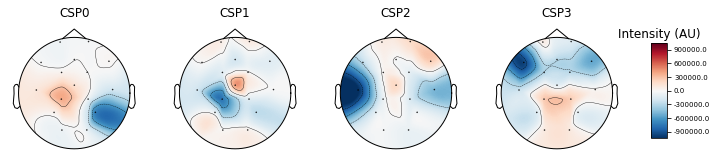

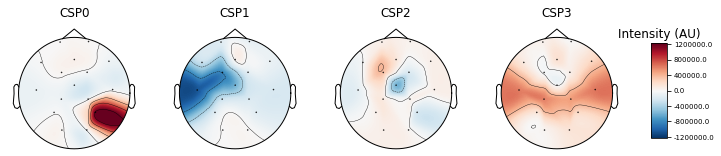

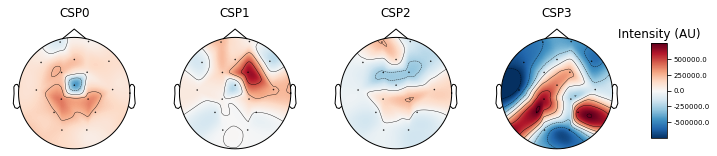

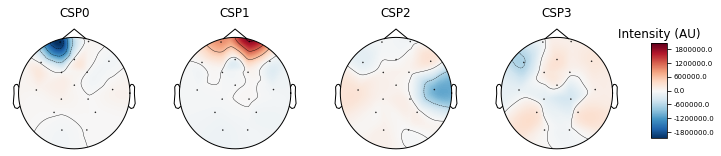

<Figure size 432x288 with 0 Axes>

In [25]:
ma_csps = eegData.MA_csp.plot_patterns(eegData.MA_epochs.info, ch_type='eeg', units='Intensity (AU)', size=1.5)
mi_csps = eegData.MI_csp.plot_patterns(eegData.MI_epochs.info, ch_type='eeg', units='Intensity (AU)', size=1.5)
la_csps = eegData.LA_csp.plot_patterns(eegData.LA_epochs.info, ch_type='eeg', units='Intensity (AU)', size=1.5)
li_csps = eegData.LI_csp.plot_patterns(eegData.LI_epochs.info, ch_type='eeg', units='Intensity (AU)', size=1.5)

## potential figure
spectrograms of motor imagery, maybe similar to https://web.media.mit.edu/~cvx/sht.htm

Doesn't look like anything, not including.

In [57]:
eegData.get_spectrograms(annotation_regexp='True-TMI-a-', variable_for_storing_spectrogram='true_tmi_a_specs', channels=['CP1', 'FC1', 'Cz'])

In [58]:
eegData.get_spectrograms(annotation_regexp='False-TMI-a-', variable_for_storing_spectrogram='false_tmi_a_specs', channels=['CP1', 'FC1', 'Cz'])

In [62]:
eegData.get_spectrograms(annotation_regexp='True-TMI-i-', variable_for_storing_spectrogram='true_tmi_i_specs', channels=['CP1', 'FC1', 'Cz'])

In [63]:
eegData.get_spectrograms(annotation_regexp='False-TMI-a-', variable_for_storing_spectrogram='false_tmi_i_specs', channels=['CP1', 'FC1', 'Cz'])

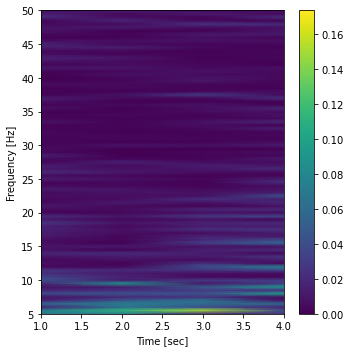

In [66]:
eegData.plot_spectrogram(eegData.false_tmi_a_specs[0])

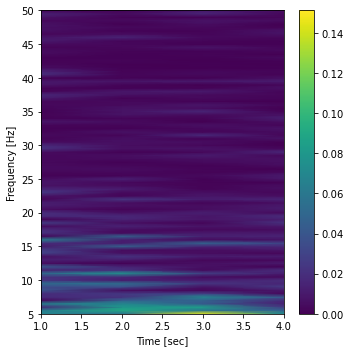

In [67]:
eegData.plot_spectrogram(eegData.true_tmi_a_specs[0])

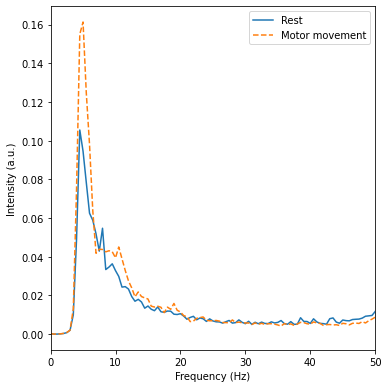

In [70]:
eegData.plot_spectrograms_2d_comparison(eegData.false_tmi_a_specs, eegData.true_tmi_a_specs, labels=['Rest', 'Motor movement'], filename='comparison_motor_movement.png')

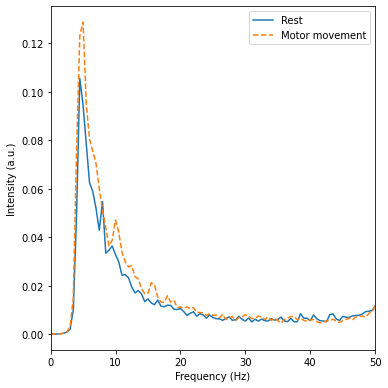

In [71]:
eegData.plot_spectrograms_2d_comparison(eegData.false_tmi_i_specs, eegData.true_tmi_i_specs, labels=['Rest', 'Motor movement'], filename='comparison_motor_imagery.png')